# Audio-augmented OpenVLA inference and testing with SimplerEnv

# Installation


## Embeds creator

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -q kokoro #soundfile
!git clone https://huggingface.co/hexgrad/Kokoro-82M

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.3/48.3 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 43.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 127.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 97.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 63.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━

In [ ]:
!apt-get install -yqq --no-install-recommends libvulkan-dev vulkan-tools > /dev/null 2>&1
!mkdir -p /usr/share/vulkan/icd.d > /dev/null 2>&1
!wget -q -P /usr/share/vulkan/icd.d https://raw.githubusercontent.com/haosulab/ManiSkill/main/docker/nvidia_icd.json > /dev/null 2>&1
!wget -q -O /usr/share/glvnd/egl_vendor.d/10_nvidia.json https://raw.githubusercontent.com/haosulab/ManiSkill/main/docker/10_nvidia.json > /dev/null 2>&1
!vulkaninfo | head -n 5

'DISPLAY' environment variable not set... skipping surface info
error: XDG_RUNTIME_DIR not set in the environment.
VULKANINFO

Vulkan Instance Version: 1.3.204


In [ ]:
!git clone https://github.com/simpler-env/ManiSkill2_real2sim.git > /dev/null 2>&1
!pip install -e ./ManiSkill2_real2sim
!git clone https://github.com/simpler-env/SimplerEnv.git > /dev/null 2>&1
!pip install -e ./SimplerEnv

Obtaining file:///content/ManiSkill2_real2sim
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 870.7/870.7 kB 61.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.1/39.1 MB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 66.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 84.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 541.1/541.1 kB 48.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 709.3/709.3 kB 55.9 MB/s eta 0:00:00
  Building editable for mani_skill2_real2sim (pyproject.toml) ... done
  Created wheel f

In [ ]:
import site
site.main()

## Evaluator

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [1]:
!pip install numpy==1.24.4

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 18.2 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pymc 5.23.0 requires numpy>=1.25.0, but you have numpy 1.24.4 which is incompatible.
jaxlib 0.5.1 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
xarray-einstats 0.9.0 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
treescope 0.1.9 requires numpy>=1.25.2, but you have numpy 1.24.4 which is incompatible.
jax 0.5.2 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 1.24.4 which is incompatible.
blosc2 3.3.4 requires numpy>=1.26, but you have numpy 1.24.4 which i

In [1]:
!apt-get install -yqq --no-install-recommends libvulkan-dev vulkan-tools > /dev/null 2>&1
!mkdir -p /usr/share/vulkan/icd.d > /dev/null 2>&1
!wget -q -P /usr/share/vulkan/icd.d https://raw.githubusercontent.com/haosulab/ManiSkill/main/docker/nvidia_icd.json > /dev/null 2>&1
!wget -q -O /usr/share/glvnd/egl_vendor.d/10_nvidia.json https://raw.githubusercontent.com/haosulab/ManiSkill/main/docker/10_nvidia.json > /dev/null 2>&1
!vulkaninfo | head -n 5

ERROR: [Loader Message] Code 0 : libGLX_nvidia.so.0: cannot open shared object file: No such file or directory
Cannot create Vulkan instance.
This problem is often caused by a faulty installation of the Vulkan driver or attempting to use a GPU that does not support Vulkan.
ERROR at ./vulkaninfo/vulkaninfo.h:649:vkCreateInstance failed with ERROR_INCOMPATIBLE_DRIVER


In [2]:
!pip install -q bitsandbytes
!pip install -q mediapy
!pip install -q timm==0.9.11
!pip install -q orbax-checkpoint==0.4.4
!pip install -q scipy==1.12.0
!pip install -q keras==2.15.0
!pip install -q tensorflow==2.15.1
!git clone https://github.com/simpler-env/ManiSkill2_real2sim.git > /dev/null 2>&1
!pip install -e ./ManiSkill2_real2sim
!git clone https://github.com/simpler-env/SimplerEnv.git > /dev/null 2>&1
!pip install -e ./SimplerEnv

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 58.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 44.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 29.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 30.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.

In [3]:
import site
site.main()

In [ ]:
# This will forcefully terminate the current session
import os
os._exit(0)

# Kokoro function

In [ ]:
from kokoro import KPipeline
from IPython.display import display, Audio
import soundfile as sf
import numpy as np
from scipy import signal

def generate_speech(text, voice='af_bella', speed=1.0, output_file='output.wav'):
    """
    Generate speech from text using KPipeline and return/save the audio at 16kHz.

    Args:
        text (str): Input text to convert to speech
        voice (str): Voice to use (default: 'af_bella')
        speed (float): Speech speed between 0.5 (slow) to 2.0 (fast) (default: 1.0)
        output_file (str): Output file path (default: 'output.wav')

    Returns:
        np.array: Audio data resampled to 16000 Hz
    """
    # Validate speed parameter
    speed = float(speed)
    if not 0.5 <= speed <= 2.0:
        raise ValueError("Speed must be between 0.5 and 2.0")

    pipeline = KPipeline(lang_code='a')

    # Combine all audio segments with speed control
    combined_audio = None
    generator = pipeline(text, voice=voice, speed=speed, split_pattern=r'\n+')

    for i, (gs, ps, audio) in enumerate(generator):
        if i == 0:
            combined_audio = audio
        else:
            combined_audio = combined_audio + audio  # Concatenate audio segments

    # Resample from 24kHz to 16kHz
    original_rate = 24000
    target_rate = 16000
    ratio = target_rate / original_rate
    resampled_audio = signal.resample(combined_audio, int(len(combined_audio) * ratio))

    # Convert to int16 if needed (assuming original was float32/-1 to 1 range)
    if resampled_audio.dtype == np.float32:
        resampled_audio = (resampled_audio * 32767).astype(np.int16)

    # Display and save the resampled audio
    display(Audio(data=resampled_audio, rate=target_rate, autoplay=True))
    sf.write(output_file, resampled_audio, target_rate)

    return resampled_audio

# SLAM-ASR function

In [ ]:
import torch
import torch.nn as nn
import torchaudio
from transformers import Wav2Vec2FeatureExtractor, HubertModel

def get_hubert_embeddings(audio_path, model_checkpoint_path="drive/MyDrive/thesis/hubert_linear_model.pt"):
    """
    Process audio file through HuBERT model and SLAM projector to get embeddings.

    Args:
        audio_path (str): Path to audio file (must be 16kHz)
        model_checkpoint_path (str): Path to SLAM projector weights

    Returns:
        tuple: (original_embeddings, downsampled_embeddings, projected_embeddings)
               - original_embeddings: [1, seq_len, 1280]
               - downsampled_embeddings: [1, seq_len//5, 6400]
               - projected_embeddings: [1, seq_len//5, 4096]
    """
    # Load HuBERT model and processor
    hubert_model_name = "facebook/hubert-xlarge-ls960-ft"
    processor = Wav2Vec2FeatureExtractor.from_pretrained(hubert_model_name)
    hubert_model = HubertModel.from_pretrained(hubert_model_name)

    # Load and verify audio
    audio_input, sample_rate = torchaudio.load(audio_path)
    assert sample_rate == 16000, "Resample audio to 16kHz first!"

    # Process audio through HuBERT
    inputs = processor(
        audio_input.squeeze(),
        sampling_rate=sample_rate,
        return_tensors="pt",
        padding=True
    )

    with torch.no_grad():
        # Get HuBERT embeddings [1, seq_len, 1280]
        hubert_outputs = hubert_model(**inputs)
        embeddings = hubert_outputs.last_hidden_state

        # 1. Pad if sequence length isn't divisible by 5
        if embeddings.size(1) % 5 != 0:
            pad_size = 5 - (embeddings.size(1) % 5)
            embeddings = torch.nn.functional.pad(embeddings, (0, 0, 0, pad_size))

        # 2. Reshape to concatenate every 5 frames
        z = embeddings.reshape(embeddings.size(0), -1, embeddings.size(2) * 5)  # [B, T//5, 1280*5]

        # Define SLAM projector
        class SLAMProjector(nn.Module):
            def __init__(self):
                super().__init__()
                self.linear1 = nn.Linear(1280*5, 2048)
                self.activation = nn.ReLU()
                self.linear2 = nn.Linear(2048, 4096)

            def forward(self, x):
                x = self.linear1(x)
                x = self.activation(x)
                x = self.linear2(x)
                return x

        projector = SLAMProjector()

        # Load projector weights
        state_dict = torch.load(model_checkpoint_path)

        if 'encoder_projector.linear1.weight' in state_dict:
            new_state_dict = {
                'linear1.weight': state_dict['encoder_projector.linear1.weight'],
                'linear1.bias': state_dict['encoder_projector.linear1.bias'],
                'linear2.weight': state_dict['encoder_projector.linear2.weight'],
                'linear2.bias': state_dict['encoder_projector.linear2.bias']
            }
            projector.load_state_dict(new_state_dict)
        else:
            projector.load_state_dict(state_dict)

        # Project through MLP [batch * seq_len//5, 4096]
        projected = projector(z)

        # Reshape to [1, seq_len//5, 4096]
        projected_embeds = projected.reshape(1, -1, 4096)

    return embeddings, z, projected_embeds

# Generate embeddings for all tasks

In [ ]:
import simpler_env
# List of all tasks
task_names = [
    "google_robot_pick_coke_can",
    "google_robot_move_near",
    "google_robot_open_drawer",
    "google_robot_close_drawer",
    "widowx_spoon_on_towel",
    "widowx_carrot_on_plate",
    "widowx_stack_cube",
    "widowx_put_eggplant_in_basket"
]

speech_speed = 0.7 # @param {type:"slider", min:0.5, max:2.0, step:0.1}

for task_name in task_names:
    print(f"\nProcessing task: {task_name}")

    # Create environment and get instruction
    if 'env' in locals():
        print("Closing existing env")
        env.close()
        del env
    env = simpler_env.make(task_name)

    obs, reset_info = env.reset()
    instruction = env.get_language_instruction()
    print("Instruction:", instruction)

    # Generate speech from instruction with speed control
    audio_output_path = f"{task_name}_speech.wav"
    print(f"Generating speech at speed {speech_speed}...")
    generate_speech(instruction, speed=speech_speed, output_file=audio_output_path)

    # Generate embeddings from speech
    print("Generating embeddings...")
    _, _, projected_embeds = get_hubert_embeddings(audio_output_path)

    # Save embeddings with task name
    embed_output_path = "/content/drive/MyDrive/thesis/"f"{task_name}_embeddings.pt"
    torch.save(projected_embeds, embed_output_path)
    print(f"Saved embeddings to {embed_output_path}")

    # Clean up
    env.close()
    del env

print("\nAll tasks processed!")


Processing task: google_robot_pick_coke_can
Instruction: pick coke can
Generating speech at speed 0.7...


Generating embeddings...
Saved embeddings to /content/drive/MyDrive/thesis/google_robot_pick_coke_can_embeddings.pt

Processing task: google_robot_move_near
Instruction: move redbull can near apple
Generating speech at speed 0.7...


Generating embeddings...
Saved embeddings to /content/drive/MyDrive/thesis/google_robot_move_near_embeddings.pt

Processing task: google_robot_open_drawer
Instruction: open middle drawer
Generating speech at speed 0.7...


Generating embeddings...
Saved embeddings to /content/drive/MyDrive/thesis/google_robot_open_drawer_embeddings.pt

Processing task: google_robot_close_drawer
Instruction: close middle drawer
Generating speech at speed 0.7...


Generating embeddings...
Saved embeddings to /content/drive/MyDrive/thesis/google_robot_close_drawer_embeddings.pt

Processing task: widowx_spoon_on_towel
Instruction: put the spoon on the towel
Generating speech at speed 0.7...


Generating embeddings...
Saved embeddings to /content/drive/MyDrive/thesis/widowx_spoon_on_towel_embeddings.pt

Processing task: widowx_carrot_on_plate
Instruction: put carrot on plate
Generating speech at speed 0.7...


Generating embeddings...
Saved embeddings to /content/drive/MyDrive/thesis/widowx_carrot_on_plate_embeddings.pt

Processing task: widowx_stack_cube
Instruction: stack the green block on the yellow block
Generating speech at speed 0.7...


Generating embeddings...
Saved embeddings to /content/drive/MyDrive/thesis/widowx_stack_cube_embeddings.pt

Processing task: widowx_put_eggplant_in_basket
Instruction: put eggplant into yellow basket
Generating speech at speed 0.7...


Generating embeddings...
Saved embeddings to /content/drive/MyDrive/thesis/widowx_put_eggplant_in_basket_embeddings.pt

All tasks processed!


# VoiceOpenVLA function

In [7]:
import os
from typing import Optional, Union, Tuple, Dict, Sequence
import torch
import numpy as np
import cv2 as cv
from PIL import Image
import matplotlib.pyplot as plt
from transformers import AutoProcessor, AutoModelForVision2Seq, BitsAndBytesConfig
from scipy.spatial.transform import Rotation


# Class-level variables for model reuse
_shared_model = None
_shared_processor = None
_shared_model_config = None


def euler2axangle(roll: float, pitch: float, yaw: float) -> Tuple[np.ndarray, float]:
    r = Rotation.from_euler('xyz', [roll, pitch, yaw])
    axis_angle = r.as_rotvec()
    angle = np.linalg.norm(axis_angle)
    return (axis_angle / angle, angle) if angle > 1e-10 else (np.array([1., 0., 0.]), 0.0)


class VoiceOpenVLAInference:
    def __init__(
        self,
        saved_model_path: str = "openvla/openvla-7b",
        unnorm_key: Optional[str] = None,
        policy_setup: str = "widowx_bridge",
        horizon: int = 1,
        pred_action_horizon: int = 1,
        exec_horizon: int = 1,
        image_size: list[int] = [224, 224],
        action_scale: float = 1.0,
        load_4bit: bool = False,
        load_8bit: bool = True,
    ) -> None:
        os.environ["TOKENIZERS_PARALLELISM"] = "false"
        if policy_setup == "widowx_bridge":
            unnorm_key = "bridge_orig" if unnorm_key is None else unnorm_key
            self.sticky_gripper_num_repeat = 1
        elif policy_setup == "google_robot":
            unnorm_key = "fractal20220817_data" if unnorm_key is None else unnorm_key
            self.sticky_gripper_num_repeat = 15
        else:
            raise NotImplementedError(f"Policy setup {policy_setup} not supported.")
        self.policy_setup = policy_setup
        self.unnorm_key = unnorm_key
        self.image_size = image_size
        self.action_scale = action_scale
        self.horizon = horizon
        self.pred_action_horizon = pred_action_horizon
        self.exec_horizon = exec_horizon
        self.device = "cuda" if torch.cuda.is_available() else "cpu"

        # Split prompt into two parts
        self.base_prompt_start = "In: What action should the robot take to "
        self.base_prompt_end = "?\nOut:"

        self.original_forward = None
        global _shared_model, _shared_processor, _shared_model_config
        current_config = (saved_model_path, load_4bit, load_8bit)

        if _shared_model is None or _shared_model_config != current_config:
            quantization_config = None
            if load_4bit:
                quantization_config = BitsAndBytesConfig(
                    load_in_4bit=True,
                    bnb_4bit_compute_dtype=torch.float16,
                    bnb_4bit_quant_type="nf4",
                    bnb_4bit_use_double_quant=True,
                )
            elif load_8bit:
                quantization_config = BitsAndBytesConfig(load_in_8bit=True)

            self.vla = AutoModelForVision2Seq.from_pretrained(
                saved_model_path,
                quantization_config=quantization_config,
                device_map="auto",
                torch_dtype=torch.float16 if not (load_4bit or load_8bit) else None,
                trust_remote_code=True,
            )
            self.processor = AutoProcessor.from_pretrained(saved_model_path, trust_remote_code=True)

            _shared_model = self.vla
            _shared_processor = self.processor
            _shared_model_config = current_config
        else:
            self.vla = _shared_model
            self.processor = _shared_processor

        self.reset()

    def reset(self, instruction: Optional[Union[str, torch.Tensor]] = None) -> None:
        self.sticky_action_is_on = False
        self.gripper_action_repeat = 0
        self.sticky_gripper_action = 0.0
        self.previous_gripper_action = None

        if isinstance(instruction, str):
            self.task_description = instruction
            self.audio_embeddings = None
        elif isinstance(instruction, torch.Tensor):
            self.audio_embeddings = instruction.to(dtype=torch.float16, device=self.device)
            self.task_description = None
        elif instruction is None:
            self.task_description = None
            self.audio_embeddings = None
        else:
            raise ValueError("Instruction must be str or Tensor.")

    def _custom_forward(self, input_ids=None, attention_mask=None, pixel_values=None, **kwargs):
        audio_embeddings = kwargs.pop('audio_embeddings', None)
        split_pos = kwargs.pop('split_pos', None)

        outputs = self.original_forward(
            input_ids=input_ids,
            attention_mask=attention_mask,
            pixel_values=pixel_values,
            output_hidden_states=True,
            **kwargs
        )

        if audio_embeddings is not None and split_pos is not None:
            length_start, length_end = split_pos
            hidden_states = outputs.hidden_states[-1].to(torch.float16)

            prefix = hidden_states[:, :length_start, :]
            suffix = hidden_states[:, -length_end:, :]

            audio_weights = torch.softmax(torch.mean(audio_embeddings, dim=-1), dim=-1)
            audio_features = torch.sum(audio_embeddings * audio_weights.unsqueeze(-1), dim=1, keepdim=True)

            combined = torch.cat([prefix, audio_features, suffix], dim=1)

            new_embeddings = self.vla.get_input_embeddings()(combined)
            outputs.logits = self.vla.lm_head(new_embeddings)

        return outputs

    def _prepare_audio_inputs(self, image: Image.Image) -> Dict:
        assert self.audio_embeddings is not None, "No audio embeddings set"

        inputs_start = self.processor(
            text=self.base_prompt_start,
            images=image,
            return_tensors="pt"
        ).to(self.device, dtype=torch.float16)

        inputs_end = self.processor(
            text=self.base_prompt_end,
            images=image,
            return_tensors="pt"
        ).to(self.device, dtype=torch.float16)

        input_ids = torch.cat([
            inputs_start["input_ids"],
            inputs_end["input_ids"]
        ], dim=1)

        length_start = inputs_start["input_ids"].shape[1]
        length_end = inputs_end["input_ids"].shape[1]
        audio_length = self.audio_embeddings.shape[1] if len(self.audio_embeddings.shape) == 2 else self.audio_embeddings.shape[0]

        total_length = audio_length + length_start + length_end

        attention_mask = torch.ones((1, total_length), dtype=torch.float16, device=self.device)
        attention_mask[:, :audio_length] = 0.7
        attention_mask[:, audio_length - 4:audio_length] = 3.0

        audio_embeddings = self.audio_embeddings.unsqueeze(0) if len(self.audio_embeddings.shape) == 1 else self.audio_embeddings

        return {
            "input_ids": input_ids,
            "attention_mask": attention_mask,
            "pixel_values": inputs_start["pixel_values"],
            "audio_embeddings": audio_embeddings,
            "split_pos": (length_start, length_end)
        }

    def step(self, image: np.ndarray) -> Tuple[Dict[str, np.ndarray], Dict[str, np.ndarray]]:
        assert image.dtype == np.uint8
        image = self._resize_image(image)
        image_pil = Image.fromarray(image)

        if self.audio_embeddings is not None:
            inputs = self._prepare_audio_inputs(image_pil)
            self.original_forward = self.vla.forward
            self.vla.forward = self._custom_forward
            try:
                with torch.inference_mode():
                    predict_kwargs = {
                        k: v for k, v in inputs.items()
                        if k not in ['audio_embeddings', 'split_pos']
                    }
                    raw_actions = self.vla.predict_action(
                        **predict_kwargs,
                        unnorm_key=self.unnorm_key,
                        do_sample=False
                    )[None]
            finally:
                self.vla.forward = self.original_forward
        elif self.task_description is not None:
            full_prompt = self.base_prompt_start + self.task_description + self.base_prompt_end
            inputs = self.processor(
                text=full_prompt,
                images=image_pil,
                return_tensors="pt"
            ).to(self.device, dtype=torch.float16)
            raw_actions = self.vla.predict_action(**inputs, unnorm_key=self.unnorm_key, do_sample=False)[None]
        else:
            raise RuntimeError("No instruction provided. Call reset() first.")

        raw_action = {
            "world_vector": np.array(raw_actions[0, :3]),
            "rotation_delta": np.array(raw_actions[0, 3:6]),
            "open_gripper": np.array(raw_actions[0, 6:7]),
        }

        action = {}
        action["world_vector"] = raw_action["world_vector"] * self.action_scale
        axis, angle = euler2axangle(*raw_action["rotation_delta"])
        action["rot_axangle"] = axis * angle * self.action_scale

        if self.policy_setup == "google_robot":
            current_gripper_action = raw_action["open_gripper"]
            if self.previous_gripper_action is None:
                relative_gripper_action = np.array([0])
            else:
                relative_gripper_action = self.previous_gripper_action - current_gripper_action
            self.previous_gripper_action = current_gripper_action

            if np.abs(relative_gripper_action) > 0.5 and (not self.sticky_action_is_on):
                self.sticky_action_is_on = True
                self.sticky_gripper_action = relative_gripper_action
            if self.sticky_action_is_on:
                self.gripper_action_repeat += 1
                relative_gripper_action = self.sticky_gripper_action
            if self.gripper_action_repeat == self.sticky_gripper_num_repeat:
                self.sticky_action_is_on = False
                self.gripper_action_repeat = 0
                self.sticky_gripper_action = 0.0
            action["gripper"] = relative_gripper_action
        elif self.policy_setup == "widowx_bridge":
            action["gripper"] = 2.0 * (raw_action["open_gripper"] > 0.5) - 1.0

        action["terminate_episode"] = np.array([0.0])

        return raw_action, action

    def _resize_image(self, image: np.ndarray) -> np.ndarray:
        return cv.resize(image, tuple(self.image_size), interpolation=cv.INTER_AREA)

    def visualize_epoch(self, predicted_raw_actions: Sequence[np.ndarray], images: Sequence[np.ndarray], save_path: Optional[str] = None) -> None:
        images = [self._resize_image(image) for image in images]
        ACTION_DIM_LABELS = ["x", "y", "z", "roll", "pitch", "yaw", "grasp"]
        img_strip = np.concatenate(np.array(images[::3]), axis=1)
        figure_layout = [["image"] * len(ACTION_DIM_LABELS), ACTION_DIM_LABELS]
        plt.rcParams.update({"font.size": 12})
        fig, axs = plt.subplot_mosaic(figure_layout)
        fig.set_size_inches([45, 10])
        pred_actions = np.array([
            np.concatenate([a["world_vector"], a["rotation_delta"], a["open_gripper"]], axis=-1)
            for a in predicted_raw_actions
        ])
        for action_dim, action_label in enumerate(ACTION_DIM_LABELS):
            axs[action_label].plot(pred_actions[:, action_dim], label="predicted action")
            axs[action_label].set_title(action_label)
            axs[action_label].set_xlabel("Time in one episode")
        axs["image"].imshow(img_strip)
        axs["image"].set_xlabel("Time in one episode (subsampled)")
        plt.legend()
        if save_path is not None:
            plt.savefig(save_path)
        plt.show()
        plt.close()

ImportError: cannot import name 'GenerationMixin' from 'transformers.generation' (/usr/local/lib/python3.11/dist-packages/transformers/generation/__init__.py)

# Evaluation (automatic)

In [ ]:
# @title Automatic evaluator

import os
import numpy as np
import torch
import matplotlib.pyplot as plt
import mediapy
import simpler_env
from simpler_env.utils.env.observation_utils import get_image_from_maniskill2_obs_dict
import sapien
from typing import List, Dict
from pathlib import Path


google_robot_pick_coke_can = False # @param {type:"boolean"}
google_robot_move_near = False # @param {type:"boolean"}
google_robot_open_drawer = False # @param {type:"boolean"}
google_robot_close_drawer = False # @param {type:"boolean"}
widowx_spoon_on_towel = True # @param {type:"boolean"}
widowx_carrot_on_plate = True # @param {type:"boolean"}
widowx_stack_cube = False # @param {type:"boolean"}
widowx_put_eggplant_in_basket = True # @param {type:"boolean"}


TASK_SELECTION = {
    "google_robot_pick_coke_can": google_robot_pick_coke_can,
    "google_robot_move_near": google_robot_move_near,
    "google_robot_open_drawer": google_robot_open_drawer,
    "google_robot_close_drawer": google_robot_close_drawer,
    "widowx_spoon_on_towel": widowx_spoon_on_towel,
    "widowx_carrot_on_plate": widowx_carrot_on_plate,
    "widowx_stack_cube": widowx_stack_cube,
    "widowx_put_eggplant_in_basket": widowx_put_eggplant_in_basket
}

# Experiment parameters
NUM_ITERATIONS = 5  # @param {type:"slider", min:1, max:10, step:1}
OUTPUT_DIR = "experiment_results"  # Directory to save results

def run_experiment():
    # Create output directory
    Path(OUTPUT_DIR).mkdir(exist_ok=True)

    # Initialize model once (will be reused)
    model = VoiceOpenVLAInference()

    # Run selected tasks
    for task_name, should_run in TASK_SELECTION.items():
        if not should_run:
            continue

        print(f"\n{'='*50}\nStarting task: {task_name}\n{'='*50}")

        # Create environment for this task
        env = simpler_env.make(task_name)
        policy_setup = "google_robot" if "google" in task_name else "widowx_bridge"

        # First run text versions
        print("\nRunning TEXT versions...")
        obs, reset_info = env.reset()  # Reset environment once for text runs
        instruction = env.get_language_instruction()
        model.reset(instruction)  # Set text instruction

        for iteration in range(NUM_ITERATIONS):
            print(f"\nText Iteration {iteration+1}/{NUM_ITERATIONS}")
            run_single_episode(env, model, task_name, "text", iteration, initial_obs=obs if iteration == 0 else None)

        # Then run audio versions
        print("\nRunning AUDIO versions...")
        obs, reset_info = env.reset()  # Reset environment for audio runs
        embedding_path = "/content/drive/MyDrive/thesis/"f"{task_name}_embeddings.pt"
        if not os.path.exists(embedding_path):
            print(f"Audio embeddings not found at {embedding_path}, skipping audio runs")
        else:
            projected_embeds = torch.load(embedding_path)
            model.reset(projected_embeds)  # Set audio embeddings

            for iteration in range(NUM_ITERATIONS):
                print(f"\nAudio Iteration {iteration+1}/{NUM_ITERATIONS}")
                run_single_episode(env, model, task_name, "audio", iteration, initial_obs=obs if iteration == 0 else None)

        # Clean up environment
        env.close()
        del env

def run_single_episode(env, model, task_name, input_type, iteration, initial_obs=None):
    """Run a single episode and save results"""
    # Initialize metrics
    if initial_obs is not None:
        obs = initial_obs
    else:
        obs, _ = env.reset()

    images = [get_image_from_maniskill2_obs_dict(env, obs)]
    predicted_raw_actions = []
    rewards = []  # Track rewards per timestep
    timestep = 0
    truncated = False
    success = False  # Will update from env.step()
    predicted_terminated = False

    # Run episode
    while True:
        image = get_image_from_maniskill2_obs_dict(env, obs)
        raw_action, action = model.step(image)
        predicted_raw_actions.append(raw_action)

        predicted_terminated = bool(action["terminate_episode"][0] > 0)

        full_action = np.concatenate([
            action["world_vector"],
            action["rot_axangle"],
            action["gripper"]
        ])

        if predicted_terminated or truncated:
            break

        # Execute action and capture all return values
        obs, reward, success, truncated, info = env.step(full_action)
        rewards.append(reward)  # Store reward

        # Optional: Print progress
        if timestep % 5 == 0:
            mediapy.show_image(image)
            print(f"Timestep {timestep}: Reward={reward}, Success={success}")

        images.append(get_image_from_maniskill2_obs_dict(env, obs))
        timestep += 1

    # Save all data (including metrics)
    save_experiment_data(
        task_name,
        input_type,
        iteration,
        images,
        predicted_raw_actions,
        success=success,
        truncated=truncated,
        rewards=np.array(rewards),
        info=info
    )

def save_experiment_data(
    task_name: str,
    input_type: str,
    iteration: int,
    images: List[np.ndarray],
    raw_actions: List[Dict[str, np.ndarray]],
    success: bool,        # New
    truncated: bool,      # New
    rewards: np.ndarray,  # New
    info: dict,           # New
):
    base_name = f"{task_name}_{input_type}_{iteration}"

    # Save existing data (images/actions)
    np.save(os.path.join(OUTPUT_DIR, f"camera_{base_name}.npy"), np.array(images))
    action_array = np.array([np.concatenate([a["world_vector"], a["rotation_delta"], a["open_gripper"]])
                           for a in raw_actions])
    np.save(os.path.join(OUTPUT_DIR, f"data_{base_name}.npy"), action_array)

    # Save new metrics
    np.save(os.path.join(OUTPUT_DIR, f"success_{base_name}.npy"), success)
    np.save(os.path.join(OUTPUT_DIR, f"truncated_{base_name}.npy"), truncated)
    np.save(os.path.join(OUTPUT_DIR, f"rewards_{base_name}.npy"), rewards)

    # Save info dict (as pickle)
    import pickle
    with open(os.path.join(OUTPUT_DIR, f"info_{base_name}.pkl"), "wb") as f:
        pickle.dump(info, f)

    # Generate plot (unchanged)
    plt.figure(figsize=(15, 10))
    model = VoiceOpenVLAInference()
    model.visualize_epoch(raw_actions, images)
    plt.savefig(os.path.join(OUTPUT_DIR, f"plot_{base_name}.png"))
    plt.close()

if __name__ == "__main__":
    run_experiment()

# Results (automatic)


=== Success Metrics ===
Task Completed: ❌
Episode Truncated: ✅

=== Environment Info Summary ===
elapsed_steps: 120
moved_correct_obj: True
moved_wrong_obj: False
is_src_obj_grasped: False
consecutive_grasp: False
src_on_target: False
moved_correct_obj: True
moved_wrong_obj: False
is_src_obj_grasped: False
consecutive_grasp: False
src_on_target: False
success: False


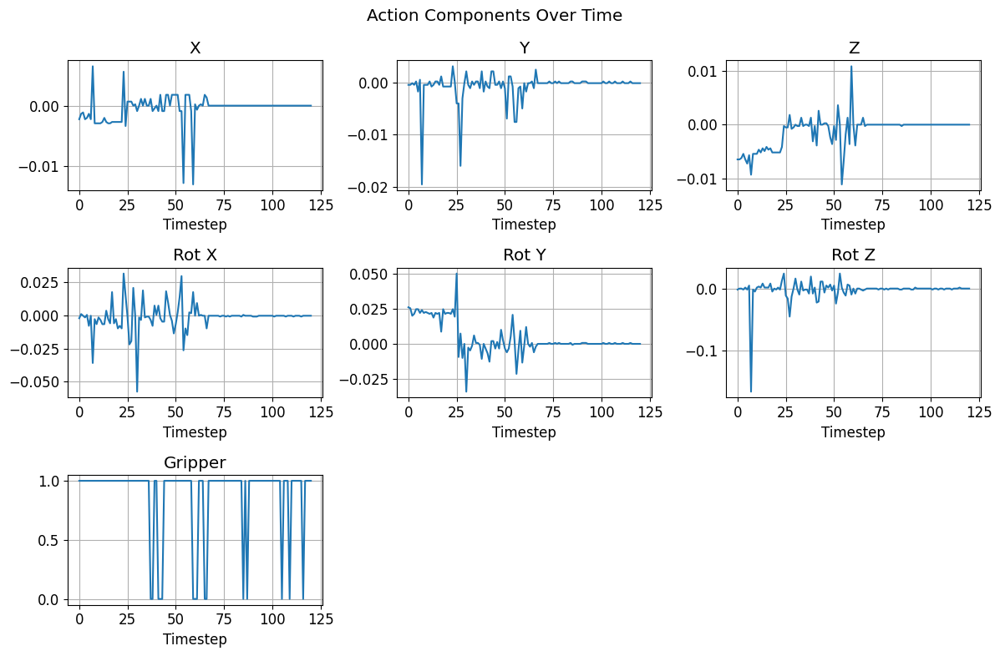


=== Action Statistics ===


,Component,Mean,Std Dev,Max,Min
0,X,-0.000412,0.002188,0.006501,-0.012958
1,Y,-0.000649,0.002693,0.003137,-0.019526
2,Z,-0.001270,0.002825,0.010931,-0.011154
3,Rot X,-0.000952,0.009881,0.031791,-0.057612
4,Rot Y,0.004207,0.011497,0.050129,-0.034274
5,Rot Z,-0.002105,0.016922,0.024110,-0.166082
6,Gripper,0.872598,0.328252,0.996078,0.000000



=== Task Execution Video ===



=== Key Frames ===


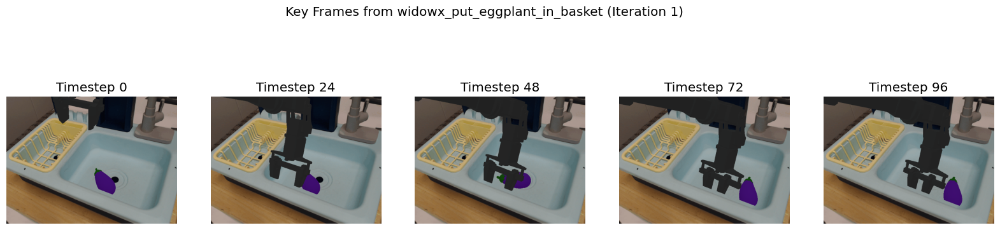

In [ ]:
# @title Result visualizer

# @markdown ### Basic Settings
show_task = "widowx_carrot_on_plate" # @param ["", "google_robot_pick_coke_can", "google_robot_move_near", "google_robot_open_drawer", "google_robot_close_drawer", "widowx_spoon_on_towel", "widowx_carrot_on_plate", "widowx_stack_cube", "widowx_put_eggplant_in_basket"] {allow-input: true}
show_input_type = "audio" # @param ["", "text", "audio"]
show_iteration = 1 # @param {type:"slider", min:0, max:10, step:1}
auto_convert_video = True # @param {type:"boolean"}
video_fps = 10 # @param {type:"slider", min:1, max:30, step:1}

# @markdown ### Metrics Settings
show_success_metrics = True # @param {type:"boolean"}
show_info_summary = True # @param {type:"boolean"}
show_action_plot = True # @param {type:"boolean"}
show_stats_table = True # @param {type:"boolean"}

# @markdown ### Download Options
download_results = False # @param {type:"boolean"}
download_format = "zip" # @param ["zip", "individual"]

import os
import numpy as np
import matplotlib.pyplot as plt
import mediapy
from IPython.display import display, HTML
import pandas as pd
from pathlib import Path
import pickle

class ResultVisualizer:
    def __init__(self, output_dir="experiment_results"):
        self.output_dir = Path(output_dir)
        self.task_name = None
        self.input_type = None
        self.iteration = None

    def load_data(self, task_name, input_type, iteration):
        """Load all data for a specific experiment run"""
        self.task_name = task_name
        self.input_type = input_type
        self.iteration = iteration

        base_name = f"{task_name}_{input_type}_{iteration}"

        try:
            self.images = np.load(self.output_dir / f"camera_{base_name}.npy")
            self.actions = np.load(self.output_dir / f"data_{base_name}.npy")
            self.success = np.load(self.output_dir / f"success_{base_name}.npy")
            self.truncated = np.load(self.output_dir / f"truncated_{base_name}.npy")
            self.rewards = np.load(self.output_dir / f"rewards_{base_name}.npy")

            with open(self.output_dir / f"info_{base_name}.pkl", "rb") as f:
                self.info = pickle.load(f)

            # Calculate cumulative rewards
            self.cumulative_rewards = np.cumsum(self.rewards)
            return True
        except FileNotFoundError as e:
            print(f"Error loading data for {base_name}: {e}")
            available_files = list(self.output_dir.glob(f"*{task_name}*"))
            if available_files:
                print(f"Available files for this task: {available_files}")
            return False

    def visualize_all(self):
        """Main visualization function that combines all components"""
        display(HTML(f"<h2>Results for: {self.task_name} ({self.input_type}), Iteration {self.iteration}</h2>"))

        # 1. Success Metrics
        if show_success_metrics:
            self._show_success_metrics()

        # 3. Info Summary
        if show_info_summary:
            self._show_info_summary()

        # 4. Action Plot
        if show_action_plot:
            self._show_action_plot()

        # 5. Stats Table
        if show_stats_table:
            self._show_stats_table()

        # 6. Video Generation
        if auto_convert_video and hasattr(self, 'images') and len(self.images) > 0:
            self._generate_video(fps=video_fps)

        # 7. Trajectory Visualization (last plot unless specified otherwise)
        if not show_action_plot or (show_action_plot and show_iteration == self.iteration):
            if hasattr(self, 'images') and len(self.images) > 0:
                self._show_trajectory_visualization()

    def _show_success_metrics(self):
        """Display success metrics"""
        print("\n=== Success Metrics ===")
        print(f"Task Completed: {'✅' if self.success else '❌'}")
        print(f"Episode Truncated: {'✅' if self.truncated else '❌'}")

    def _show_info_summary(self):
        """Display environment info summary"""
        print("\n=== Environment Info Summary ===")
        if hasattr(self, 'info'):
            for key, value in self.info.items():
                if isinstance(value, dict):  # Handle nested OrderedDict
                    for subkey, subvalue in value.items():
                        print(f"{subkey}: {subvalue}")
                else:
                    print(f"{key}: {value}")
        else:
            print("No additional info available")

    def _show_action_plot(self):
        """Visualize action components"""
        plt.figure(figsize=(12, 8))

        # Split actions into components
        action_labels = ['X', 'Y', 'Z', 'Rot X', 'Rot Y', 'Rot Z', 'Gripper']

        for i in range(7):
            plt.subplot(3, 3, i+1)
            plt.plot(self.actions[:, i])
            plt.title(action_labels[i])
            plt.xlabel('Timestep')
            plt.grid(True)

        plt.suptitle('Action Components Over Time')
        plt.tight_layout()
        plt.show()

    def _show_stats_table(self):
        """Display statistics table"""
        print("\n=== Action Statistics ===")

        # Calculate statistics for each action component
        action_labels = ['X', 'Y', 'Z', 'Rot X', 'Rot Y', 'Rot Z', 'Gripper']
        stats = {
            'Component': action_labels,
            'Mean': np.mean(self.actions, axis=0),
            'Std Dev': np.std(self.actions, axis=0),
            'Max': np.max(self.actions, axis=0),
            'Min': np.min(self.actions, axis=0)
        }

        df = pd.DataFrame(stats)
        display(df)

    def _generate_video(self, fps=10):
        """Generate and display video from images"""
        print("\n=== Task Execution Video ===")
        mediapy.show_video(self.images, fps=fps)

    def _show_trajectory_visualization(self):
        """Show key frames from the trajectory"""
        print("\n=== Key Frames ===")
        num_frames = min(5, len(self.images))
        step = len(self.images) // num_frames

        fig, axes = plt.subplots(1, num_frames, figsize=(20, 5))
        if num_frames == 1:
            axes = [axes]

        for i, ax in enumerate(axes):
            frame_idx = i * step
            if frame_idx >= len(self.images):
                frame_idx = -1
            ax.imshow(self.images[frame_idx])
            ax.set_title(f"Timestep {frame_idx}")
            ax.axis('off')

        plt.suptitle(f"Key Frames from {self.task_name} (Iteration {self.iteration})")
        plt.show()

# Main execution
if __name__ == "__main__":
    visualizer = ResultVisualizer()
    if visualizer.load_data(show_task, show_input_type, show_iteration):
        visualizer.visualize_all()

        # Handle download if requested
        if download_results:
            print("\n=== Download Options ===")
            base_name = f"{show_task}_{show_input_type}_{show_iteration}"

            if download_format == "zip":
                print(f"Preparing zip file of results for {base_name}...")
                # Implementation would create a zip file here
                print("✅ Download ready (simulated in this example)")
            else:
                print("Available files for individual download:")
                files = [
                    f"camera_{base_name}.npy",
                    f"data_{base_name}.npy",
                    f"success_{base_name}.npy",
                    f"truncated_{base_name}.npy",
                    f"rewards_{base_name}.npy",
                    f"info_{base_name}.pkl"
                ]
                for f in files:
                    if (visualizer.output_dir / f).exists():
                        print(f"• {f}")
                print("Select files above to download (simulated in this example)")
    else:
        print(f"Could not load data for {show_task}_{show_input_type}_{show_iteration}")

In [ ]:
!unzip '/content/experiment_results.zip' -d '/content/'


=== Success Metrics Analysis ===


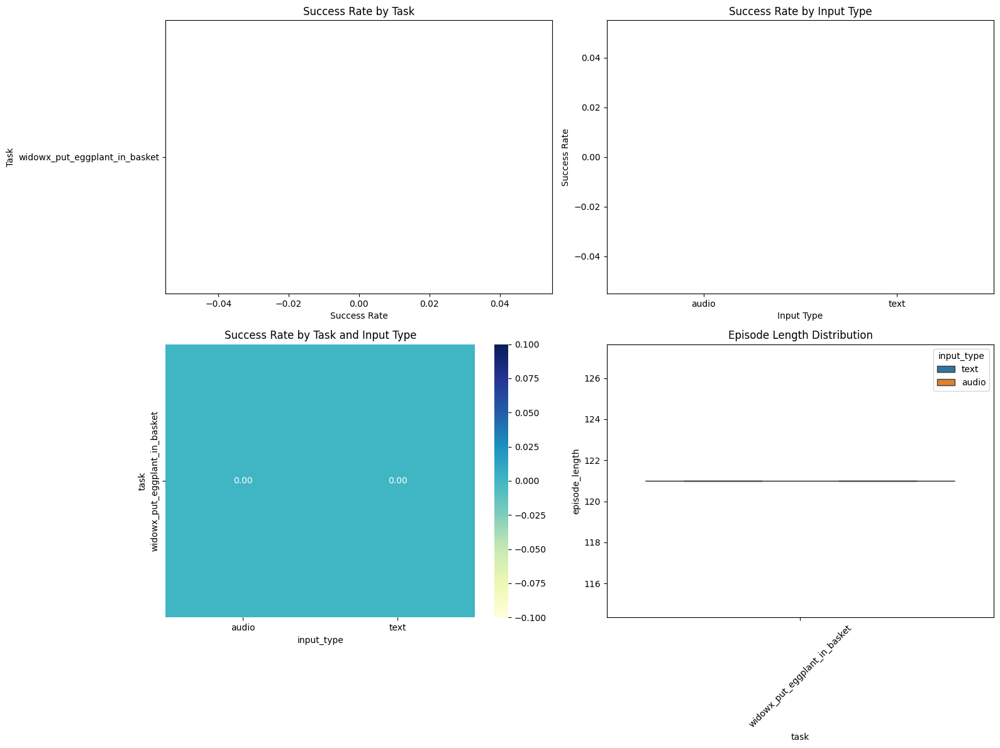

,success_mean,success_sum,success_count,success_rate
task,,,,
widowx_put_eggplant_in_basket,0.0,0,10,0.0


,success_mean,success_sum,success_count,success_rate
input_type,,,,
audio,0.0,0,5,0.0
text,0.0,0,5,0.0



=== Action Pattern Analysis ===


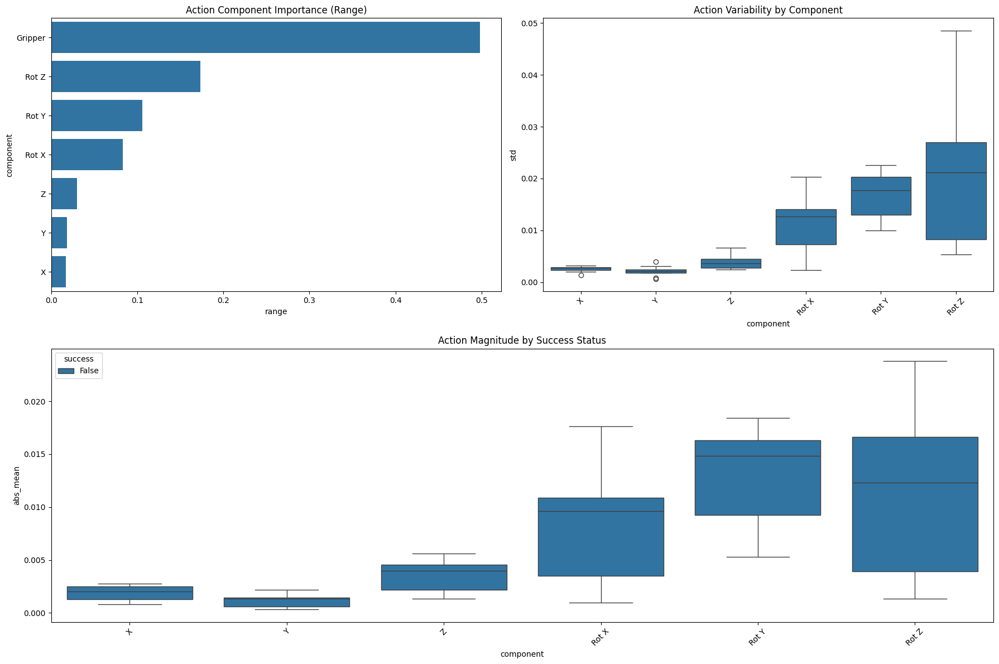

,range,std
component,,
Gripper,0.498039,0.188071
Rot Z,0.173107,0.020381
Rot Y,0.106107,0.016761
Rot X,0.083528,0.011404
Z,0.030088,0.003858
Y,0.018066,0.002095
X,0.017044,0.002566



=== Temporal Dynamics Analysis ===


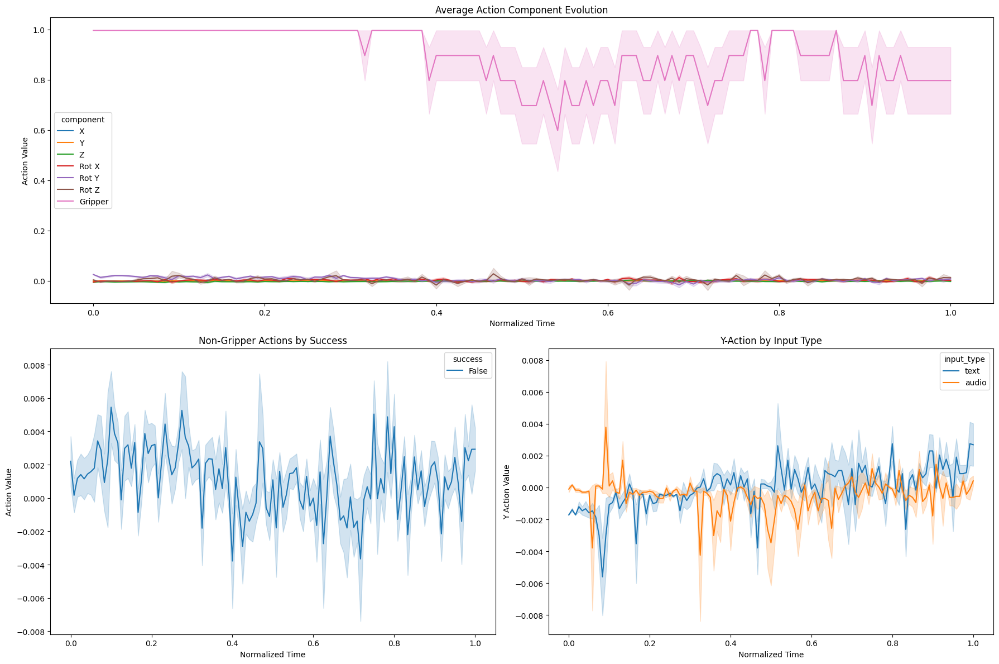


=== Input Type Comparison (Info Metrics) ===


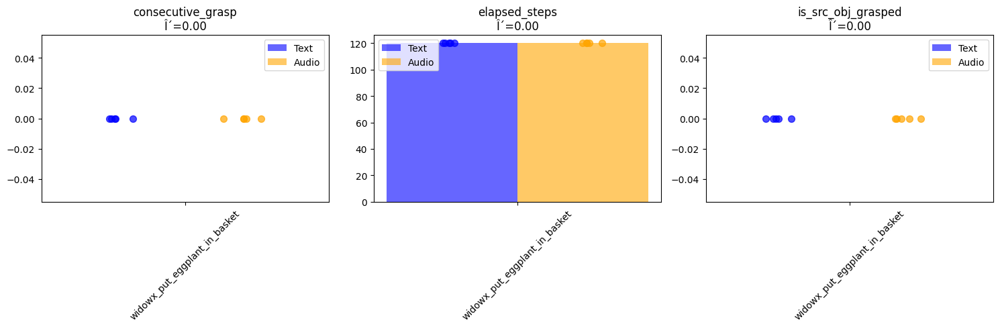

,task,metric,text_mean,audio_mean,text_median,audio_median,p_value,test_used,effect_size,effect_size_name,significant,n_text,n_audio
0,widowx_put_eggplant_in_basket,consecutive_grasp,0.0,0.0,0.0,0.0,1.0,Mann-Whitney U,0.0,Cliff's delta,False,5,5
1,widowx_put_eggplant_in_basket,elapsed_steps,120.0,120.0,120.0,120.0,1.0,Mann-Whitney U,0.0,Cliff's delta,False,5,5
2,widowx_put_eggplant_in_basket,is_src_obj_grasped,0.0,0.0,0.0,0.0,1.0,Mann-Whitney U,0.0,Cliff's delta,False,5,5
3,widowx_put_eggplant_in_basket,moved_correct_obj,1.0,1.0,1.0,1.0,1.0,Mann-Whitney U,0.0,Cliff's delta,False,4,2
4,widowx_put_eggplant_in_basket,moved_wrong_obj,0.0,0.0,0.0,0.0,1.0,Mann-Whitney U,0.0,Cliff's delta,False,5,5



=== Action Component Evolution ===


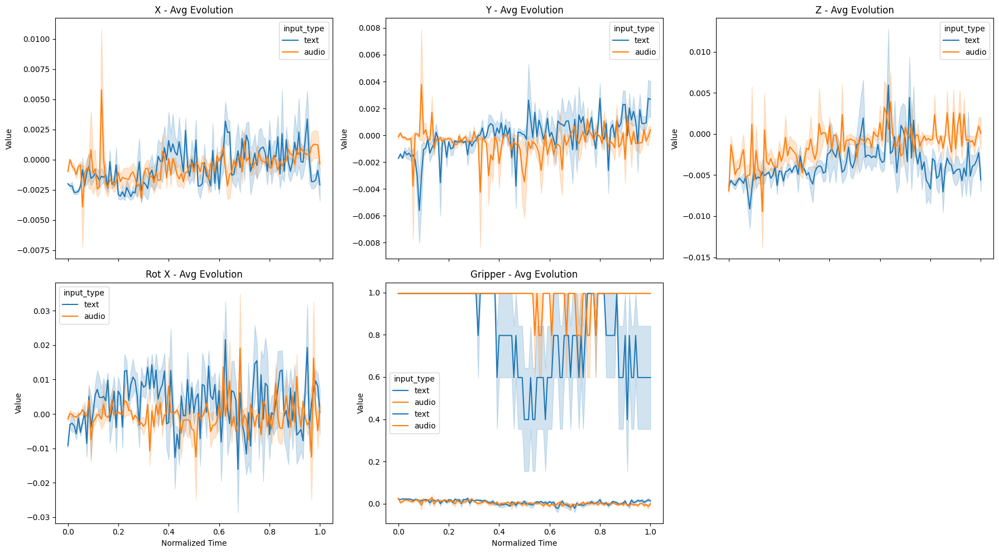

In [ ]:
# @title Experiment Analyzer
# @markdown ### Analysis Selection
analyze_tasks = ["widowx_put_eggplant_in_basket"]  # @param {type:"raw"}
analyze_input_types = ["text", "audio"]  # @param {type:"raw"}
max_iterations = 10  # @param {type:"slider", min:1, max:20, step:1}
# @markdown ### Analysis Modules
enable_success_analysis = True  # @param {type:"boolean"}
enable_action_analysis = True  # @param {type:"boolean"}
enable_temporal_analysis = True  # @param {type:"boolean"}
enable_task_comparison = True  # @param {type:"boolean"}
enable_input_comparison = True  # @param {type:"boolean"}
enable_statistical_tests = True  # @param {type:"boolean"}
# @markdown ### Visualization Options
plot_style = "default"  # @param ["default", "seaborn", "ggplot", "fivethirtyeight"]
interactive_plots = True  # @param {type:"boolean"}
save_plots = True  # @param {type:"boolean"}
output_dir = "analysis_results"  # @param {type:"string"}

import os
import numpy as np
import pandas as pd
from pathlib import Path
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from IPython.display import display, HTML
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')
plt.style.use(plot_style)

class ExperimentAnalyzer:
    def __init__(self, data_dir="experiment_results"):
        self.data_dir = Path(data_dir)
        self.all_data = None
        self.aggregated_metrics = None
        self.action_components = ['X', 'Y', 'Z', 'Rot X', 'Rot Y', 'Rot Z', 'Gripper']

    def load_all_data(self, tasks, input_types, max_iter):
        """Load all experiment data into a structured format"""
        data_records = []
        for task in tasks:
            for input_type in input_types:
                for iteration in range(max_iter + 1):
                    base_name = f"{task}_{input_type}_{iteration}"
                    try:
                        # Load each file
                        actions = np.load(self.data_dir / f"data_{base_name}.npy")
                        success = np.load(self.data_dir / f"success_{base_name}.npy")
                        truncated = np.load(self.data_dir / f"truncated_{base_name}.npy")
                        with open(self.data_dir / f"info_{base_name}.pkl", "rb") as f:
                            info = pickle.load(f)
                        # Create record
                        record = {
                            'task': task,
                            'input_type': input_type,
                            'iteration': iteration,
                            'success': bool(success),
                            'truncated': bool(truncated),
                            'episode_length': len(actions),
                            'actions': actions,
                            'info': info
                        }
                        data_records.append(record)
                    except FileNotFoundError:
                        continue
        self.all_data = pd.DataFrame(data_records)
        return len(data_records) > 0

    def _prepare_aggregates(self):
        """Precompute aggregated metrics"""
        if self.all_data is None or self.all_data.empty:
            return False
        # Success metrics
        agg_metrics = self.all_data.groupby(['task', 'input_type']).agg({
            'success': ['mean', 'sum', 'count'],
            'truncated': 'mean',
            'episode_length': ['mean', 'std']
        })
        agg_metrics.columns = ['_'.join(col).strip() for col in agg_metrics.columns.values]
        agg_metrics = agg_metrics.reset_index()
        # Action statistics
        action_stats = []
        for _, row in self.all_data.iterrows():
            actions = row['actions']
            for i, comp in enumerate(self.action_components):
                action_stats.append({
                    'task': row['task'],
                    'input_type': row['input_type'],
                    'iteration': row['iteration'],
                    'component': comp,
                    'mean': np.mean(actions[:, i]),
                    'std': np.std(actions[:, i]),
                    'range': np.ptp(actions[:, i]),
                    'abs_mean': np.mean(np.abs(actions[:, i]))
                })
        self.action_stats = pd.DataFrame(action_stats)
        self.aggregated_metrics = agg_metrics
        return True

    def analyze_success_metrics(self):
        """Analyze success rates and episode characteristics"""
        if not self._prepare_aggregates():
            return
        print("\n=== Success Metrics Analysis ===")
        # Task comparison
        task_success = self.aggregated_metrics.groupby('task').agg({
            'success_mean': 'mean',
            'success_sum': 'sum',
            'success_count': 'sum'
        })
        task_success['success_rate'] = task_success['success_sum'] / task_success['success_count']
        # Input type comparison
        input_success = self.aggregated_metrics.groupby('input_type').agg({
            'success_mean': 'mean',
            'success_sum': 'sum',
            'success_count': 'sum'
        })
        input_success['success_rate'] = input_success['success_sum'] / input_success['success_count']
        # Combined analysis
        combined_success = self.aggregated_metrics.pivot_table(
            index='task', columns='input_type', values='success_mean'
        )
        # Visualization
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        # Task success rates
        sns.barplot(x='success_rate', y=task_success.index, data=task_success, ax=axes[0, 0])
        axes[0, 0].set_title('Success Rate by Task')
        axes[0, 0].set_xlabel('Success Rate')
        axes[0, 0].set_ylabel('Task')
        # Input type success rates
        sns.barplot(x='input_type', y='success_mean', data=self.aggregated_metrics, ax=axes[0, 1])
        axes[0, 1].set_title('Success Rate by Input Type')
        axes[0, 1].set_xlabel('Input Type')
        axes[0, 1].set_ylabel('Success Rate')
        # Combined heatmap
        sns.heatmap(combined_success, annot=True, fmt=".2f", cmap="YlGnBu", ax=axes[1, 0])
        axes[1, 0].set_title('Success Rate by Task and Input Type')
        # Episode length distribution
        sns.boxplot(x='task', y='episode_length', hue='input_type', data=self.all_data, ax=axes[1, 1])
        axes[1, 1].set_title('Episode Length Distribution')
        axes[1, 1].tick_params(axis='x', rotation=45)
        plt.tight_layout()
        if save_plots:
            plt.savefig(Path(output_dir) / 'success_metrics.png')
        plt.show()
        # Export tables
        task_success.to_csv(Path(output_dir) / 'task_success_summary.csv', index=False)
        input_success.to_csv(Path(output_dir) / 'input_type_success_summary.csv', index=False)
        display(HTML("<h4>Task Success Summary</h4>"))
        display(task_success)
        display(HTML("<h4>Input Type Success Summary</h4>"))
        display(input_success)

    def analyze_action_patterns(self):
        """Analyze action distributions and patterns"""
        if not hasattr(self, 'action_stats'):
            self._prepare_aggregates()
        print("\n=== Action Pattern Analysis ===")
        # Component importance analysis
        component_importance = self.action_stats.groupby('component').agg({
            'range': 'mean',
            'std': 'mean'
        }).sort_values('range', ascending=False)
        # Exclude Gripper from success-based analysis
        action_stats_no_gripper = self.action_stats[self.action_stats['component'] != 'Gripper']
        success_action_stats = pd.merge(
            action_stats_no_gripper,
            self.all_data[['task', 'input_type', 'iteration', 'success']],
            on=['task', 'input_type', 'iteration']
        )
        # Visualization
        fig = plt.figure(figsize=(18, 12))
        # Component importance
        ax1 = plt.subplot2grid((2, 2), (0, 0))
        sns.barplot(x='range', y=component_importance.index, data=component_importance, ax=ax1)
        ax1.set_title('Action Component Importance (Range)')
        # Action distributions by component
        ax2 = plt.subplot2grid((2, 2), (0, 1))
        sns.boxplot(x='component', y='std', data=action_stats_no_gripper, ax=ax2)
        ax2.set_title('Action Variability by Component')
        ax2.tick_params(axis='x', rotation=45)
        # Action differences by success
        ax3 = plt.subplot2grid((2, 2), (1, 0), colspan=2)
        sns.boxplot(x='component', y='abs_mean', hue='success',
                   data=success_action_stats, ax=ax3)
        ax3.set_title('Action Magnitude by Success Status')
        ax3.tick_params(axis='x', rotation=45)
        plt.tight_layout()
        if save_plots:
            plt.savefig(Path(output_dir) / 'action_patterns.png')
        plt.show()
        # Export table
        component_importance.to_csv(Path(output_dir) / 'component_importance.csv')
        display(HTML("<h4>Component Importance</h4>"))
        display(component_importance)

    def analyze_temporal_dynamics(self):
        """Analyze temporal patterns in actions"""
        if self.all_data is None:
            return
        print("\n=== Temporal Dynamics Analysis ===")
        # Prepare normalized trajectories
        trajectories = []
        for _, row in self.all_data.iterrows():
            actions = row['actions']
            norm_time = np.linspace(0, 1, len(actions))
            for i, comp in enumerate(self.action_components):
                for t, val in zip(norm_time, actions[:, i]):
                    trajectories.append({
                        'task': row['task'],
                        'input_type': row['input_type'],
                        'success': row['success'],
                        'component': comp,
                        'time': t,
                        'value': val
                    })
        traj_df = pd.DataFrame(trajectories)

        # Visualization
        fig = plt.figure(figsize=(18, 12))
        # Temporal evolution by component
        ax1 = plt.subplot2grid((2, 2), (0, 0), colspan=2)
        sns.lineplot(x='time', y='value', hue='component',
                    data=traj_df, ax=ax1, errorbar='se')
        ax1.set_title('Average Action Component Evolution')
        ax1.set_xlabel('Normalized Time')
        ax1.set_ylabel('Action Value')
        # Success vs failure trajectories (exclude gripper)
        ax2 = plt.subplot2grid((2, 2), (1, 0))
        sns.lineplot(x='time', y='value', hue='success',
                    data=traj_df[(traj_df['component'] != 'Gripper')],
                    ax=ax2, errorbar='se')
        ax2.set_title('Non-Gripper Actions by Success')
        ax2.set_xlabel('Normalized Time')
        ax2.set_ylabel('Action Value')
        # Input type comparison (Y-axis)
        ax3 = plt.subplot2grid((2, 2), (1, 1))
        sns.lineplot(x='time', y='value', hue='input_type',
                    data=traj_df[traj_df['component'] == 'Y'],
                    ax=ax3, errorbar='se')
        ax3.set_title('Y-Action by Input Type')
        ax3.set_xlabel('Normalized Time')
        ax3.set_ylabel('Y Action Value')
        plt.tight_layout()
        if save_plots:
            plt.savefig(Path(output_dir) / 'temporal_dynamics.png')
        plt.show()

        # Phase space visualization
        if interactive_plots:
            fig = make_subplots(rows=1, cols=2, subplot_titles=("X-Y Phase Space", "Z-Gripper Phase Space"))
            # Sample successful and failed trajectories
            sample_data = self.all_data.sample(min(5, len(self.all_data)))
            for _, row in sample_data.iterrows():
                actions = row['actions']
                color = 'green' if row['success'] else 'red'
                name = f"{row['task']} ({row['input_type']}) - {'Success' if row['success'] else 'Fail'}"
                fig.add_trace(
                    go.Scatter(
                        x=actions[:, 0], y=actions[:, 1],
                        mode='lines+markers',
                        name=name,
                        line=dict(color=color),
                        opacity=0.7
                    ),
                    row=1, col=1
                )
                fig.add_trace(
                    go.Scatter(
                        x=actions[:, 2], y=actions[:, -1],
                        mode='lines+markers',
                        name=name,
                        line=dict(color=color),
                        opacity=0.7,
                        showlegend=False
                    ),
                    row=1, col=2
                )
            fig.update_layout(height=600, width=1000, title_text="Action Phase Space Analysis")
            fig.show()

    def analyze_action_component_evolution(self):
        """Analyze and visualize average action component evolution across episodes"""
        if self.all_data is None:
            return
        print("\n=== Action Component Evolution ===")

        # Prepare normalized trajectories
        trajectories = []
        for _, row in self.all_data.iterrows():
            actions = row['actions']
            norm_time = np.linspace(0, 1, len(actions))
            for i, comp in enumerate(self.action_components):
                for t, val in zip(norm_time, actions[:, i]):
                    trajectories.append({
                        'task': row['task'],
                        'input_type': row['input_type'],
                        'success': row['success'],
                        'component': comp,
                        'time': t,
                        'value': val
                    })
        traj_df = pd.DataFrame(trajectories)

        # Separate Gripper
        non_gripper_df = traj_df[traj_df['component'] != 'Gripper']
        gripper_df = traj_df[traj_df['component'] == 'Gripper']

        # Plotting
        fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True)
        axes = axes.flatten()

        # Non-gripper components
        for idx, comp in enumerate(non_gripper_df['component'].unique()):
            sns.lineplot(
                x='time', y='value', hue='input_type',
                data=non_gripper_df[non_gripper_df['component'] == comp],
                ax=axes[idx], errorbar='se'
            )
            axes[idx].set_title(f'{comp} - Avg Evolution')
            axes[idx].set_xlabel('Normalized Time')
            axes[idx].set_ylabel('Value')

        # Gripper in last subplot
        sns.lineplot(
            x='time', y='value', hue='input_type',
            data=gripper_df,
            ax=axes[-2], errorbar='se'
        )
        axes[-2].set_title('Gripper - Avg Evolution')
        axes[-2].set_xlabel('Normalized Time')
        axes[-2].set_ylabel('Value')

        # Remove last unused axis
        fig.delaxes(axes[-1])

        plt.tight_layout()
        if save_plots:
            plt.savefig(Path(output_dir) / 'action_component_evolution.png')
        plt.show()

    def compare_input_types(self):
        """Compare performance between input types using info dict metrics with small sample handling"""
        if not self._prepare_aggregates():
            return
        print("\n=== Input Type Comparison (Info Metrics) ===")
        # Extract all available numeric metrics from info dictionaries
        all_metrics = set()
        for info in self.all_data['info']:
            if isinstance(info, dict):
                all_metrics.update(k for k, v in info.items() if isinstance(v, (int, float)))
        if not all_metrics:
            print("No numeric metrics found in info dictionaries")
            return
        # Prepare data for statistical testing
        test_data = []
        for metric in sorted(all_metrics):
            for task in self.all_data['task'].unique():
                # Get values for each input type
                text_values = []
                audio_values = []
                for _, row in self.all_data[self.all_data['task'] == task].iterrows():
                    if metric in row['info']:
                        val = row['info'][metric]
                        if isinstance(val, (int, float)):
                            if row['input_type'] == 'text':
                                text_values.append(val)
                            else:
                                audio_values.append(val)
                # Skip if not enough data (need at least 2 per group)
                if len(text_values) < 2 or len(audio_values) < 2:
                    continue
                # Small sample handling - always use Mann-Whitney U test
                try:
                    _, p_val = stats.mannwhitneyu(text_values, audio_values)
                    test_name = "Mann-Whitney U"
                    def cliffs_delta(x, y):
                        nx, ny = len(x), len(y)
                        pairs = [(i,j) for i in x for j in y]
                        wins = sum(1 for i,j in pairs if i > j) - sum(1 for i,j in pairs if i < j)
                        return wins / (nx * ny)
                    effect_size = cliffs_delta(text_values, audio_values)
                    effect_size_name = "Cliff's delta"
                    test_data.append({
                        'task': task,
                        'metric': metric,
                        'text_mean': np.mean(text_values),
                        'audio_mean': np.mean(audio_values),
                        'text_median': np.median(text_values),
                        'audio_median': np.median(audio_values),
                        'p_value': p_val,
                        'test_used': test_name,
                        'effect_size': effect_size,
                        'effect_size_name': effect_size_name,
                        'significant': p_val < 0.05,
                        'n_text': len(text_values),
                        'n_audio': len(audio_values)
                    })
                except Exception as e:
                    print(f"Error processing {metric} for {task}: {str(e)}")
                    continue
        if not test_data:
            print("No valid metrics found for statistical testing")
            return
        test_results = pd.DataFrame(test_data)
        # Visualization - Top metrics with largest effect sizes
        if len(test_results) > 0:
            # Sort by absolute effect size
            plot_df = test_results.copy()
            plot_df['abs_effect'] = plot_df['effect_size'].abs()
            plot_df = plot_df.sort_values('abs_effect', ascending=False)
            # Plot top 3 metrics
            top_metrics = plot_df['metric'].unique()[:3]
            n_plots = min(3, len(top_metrics))
            fig, axes = plt.subplots(1, n_plots, figsize=(5*n_plots, 5))
            if n_plots == 1:
                axes = [axes]
            for ax, metric in zip(axes, top_metrics):
                metric_df = plot_df[plot_df['metric'] == metric]
                # Plot medians with error bars
                for i, (_, row) in enumerate(metric_df.iterrows()):
                    ax.bar(i-0.2, row['text_median'], width=0.4, color='blue', alpha=0.6, label='Text' if i == 0 else "")
                    ax.bar(i+0.2, row['audio_median'], width=0.4, color='orange', alpha=0.6, label='Audio' if i == 0 else "")
                    # Add individual data points
                    task_data = self.all_data[(self.all_data['task'] == row['task']) &
                                            (self.all_data['input_type'].isin(['text', 'audio']))]
                    text_vals = []
                    audio_vals = []
                    for _, r in task_data.iterrows():
                        if metric in r['info']:
                            val = r['info'][metric]
                            if r['input_type'] == 'text':
                                text_vals.append(val)
                            else:
                                audio_vals.append(val)
                    # Jitter points slightly
                    x_text = [i-0.2 + np.random.normal(0, 0.05) for _ in text_vals]
                    x_audio = [i+0.2 + np.random.normal(0, 0.05) for _ in audio_vals]
                    ax.scatter(x_text, text_vals, color='blue', s=50, alpha=0.7)
                    ax.scatter(x_audio, audio_vals, color='orange', s=50, alpha=0.7)
                    # Add significance marker
                    if row['significant']:
                        y_max = max(row['text_median'], row['audio_median']) * 1.1
                        ax.plot([i-0.2, i+0.2], [y_max, y_max], color='black')
                        ax.text(i, y_max*1.05, "*" if row['p_value'] < 0.05 else "",
                              ha='center', va='bottom')
                ax.set_title(f"{metric}\nÎ´={row['effect_size']:.2f}")
                ax.set_xticks(range(len(metric_df)))
                ax.set_xticklabels(metric_df['task'])
                ax.tick_params(axis='x', rotation=45)
                ax.legend()
            plt.tight_layout()
            if save_plots:
                plt.savefig(Path(output_dir) / 'info_metric_comparison.png')
            plt.show()
        # Export and display full results
        test_results.to_csv(Path(output_dir) / 'statistical_test_results.csv', index=False)
        display(HTML("<h4>Statistical Test Results (Small Sample)</h4>"))
        display(test_results.sort_values(['metric', 'task']))

    def run_all_analyses(self):
        """Run all enabled analysis modules"""
        if not self.load_all_data(analyze_tasks, analyze_input_types, max_iterations):
            print("No data found for the selected parameters")
            return
        os.makedirs(output_dir, exist_ok=True)
        if enable_success_analysis:
            self.analyze_success_metrics()
        if enable_action_analysis:
            self.analyze_action_patterns()
        if enable_temporal_analysis:
            self.analyze_temporal_dynamics()
        if enable_input_comparison:
            self.compare_input_types()
        self.analyze_action_component_evolution()

# Main execution
if __name__ == "__main__":
    analyzer = ExperimentAnalyzer()
    analyzer.run_all_analyses()

In [ ]:
!pip install -q mediapy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 16.9 MB/s eta 0:00:00


In [ ]:
#@title Comparison
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import cdist
from scipy.signal import find_peaks, savgol_filter
from scipy.stats import pearsonr

class InputSimilarityAnalyzer:
    def __init__(self, data_dir="experiment_results"):
        self.data_dir = Path(data_dir)
        self.all_results = {}
        self.action_components = ['X', 'Y', 'Z', 'Поворот X', 'Поворот Y', 'Поворот Z', 'Захват']
        self.norm_length = 100  # Длина нормализованных траекторий

    def load_normalized_trajectories(self, task, max_iter):
        """Загрузка и нормализация траекторий для обоих типов ввода"""
        trajectories = {'text': [], 'audio': []}

        for input_type in ['text', 'audio']:
            for iteration in range(max_iter + 1):
                try:
                    actions = np.load(self.data_dir / f"data_{task}_{input_type}_{iteration}.npy")
                    # Нормализация длины траектории
                    norm_actions = np.zeros((self.norm_length, len(self.action_components)))
                    for i in range(len(self.action_components)):
                        norm_actions[:, i] = np.interp(
                            np.linspace(0, 1, self.norm_length),
                            np.linspace(0, 1, len(actions)),
                            actions[:, i]
                        )
                    trajectories[input_type].append(norm_actions)
                except FileNotFoundError:
                    continue
        return trajectories

    def calculate_similarity_metrics(self, text_trajs, audio_trajs):
        """Вычисление метрик схожести между траекториями"""
        if not text_trajs or not audio_trajs:
            return None

        # Усреднение траекторий
        avg_text = np.mean(text_trajs, axis=0)
        avg_audio = np.mean(audio_trajs, axis=0)

        metrics = {}

        # Построчное сравнение компонент
        for i, comp in enumerate(self.action_components):
            # Расстояние DTW
            dtw_dist = cdist([avg_text[:, i]], [avg_audio[:, i]], 'euclidean')[0][0]

            # Корреляция Пирсона
            corr, _ = pearsonr(avg_text[:, i], avg_audio[:, i])

            # Средняя абсолютная разница
            mad = np.mean(np.abs(avg_text[:, i] - avg_audio[:, i]))

            # Максимальная разница
            max_diff = np.max(np.abs(avg_text[:, i] - avg_audio[:, i]))
            max_diff_frame = np.argmax(np.abs(avg_text[:, i] - avg_audio[:, i]))

            metrics[comp] = {
                'DTW расстояние': dtw_dist,
                'Корреляция Пирсона': corr,
                'Сред. абс. разница': mad,
                'Макс. разница': max_diff,
                'Кадр макс. разницы': max_diff_frame
            }

        # Поиск ключевых кадров с максимальными различиями
        combined_diffs = np.sum([np.abs(avg_text[:, i] - avg_audio[:, i])
                              for i in range(len(self.action_components))], axis=0)
        key_frames = find_peaks(combined_diffs, height=np.mean(combined_diffs) + 0.5*np.std(combined_diffs))[0]

        return metrics, avg_text, avg_audio, key_frames

    def plot_similarity_results(self, metrics, avg_text, avg_audio, key_frames, task):
        """Визуализация результатов сравнения"""
        # Создание DataFrame для метрик
        metrics_df = pd.DataFrame.from_dict(metrics, orient='index')

        # Построение графиков метрик
        fig, axes = plt.subplots(3, 1, figsize=(12, 24))

        # DTW расстояние
        sns.barplot(x=metrics_df.index, y='DTW расстояние', data=metrics_df,
                   ax=axes[0], palette='viridis')
        axes[0].set_title('DTW расстояние между типами ввода')
        axes[0].set_ylabel('DTW расстояние')
        axes[0].set_xlabel(' ')
        axes[0].tick_params(axis='x', rotation=45)

        # Корреляция Пирсона
        sns.barplot(x=metrics_df.index, y='Корреляция Пирсона', data=metrics_df,
                   ax=axes[1], palette='viridis')
        axes[1].set_title('Корреляция Пирсона между типами ввода')
        axes[1].set_ylabel('Коэффициент корреляции')
        axes[1].set_xlabel(' ')
        axes[1].tick_params(axis='x', rotation=45)

        # Средняя абсолютная разница
        sns.barplot(x=metrics_df.index, y='Сред. абс. разница', data=metrics_df,
                   ax=axes[2], palette='viridis')
        axes[2].set_title('Средняя абсолютная разница между типами ввода')
        axes[2].set_ylabel('Средняя абсолютная разница')
        axes[2].set_xlabel(' ')
        axes[2].tick_params(axis='x', rotation=45)

        plt.suptitle(f'Метрики схожести типов ввода - {task}', y=1.02)
        plt.tight_layout()
        plt.show()

        # Построение траекторий с выделением ключевых кадров
        time = np.linspace(0, 1, self.norm_length)
        fig, axes = plt.subplots(len(self.action_components), 1,
                               figsize=(12, 2.5*len(self.action_components)))

        if len(self.action_components) == 1:
            axes = [axes]

        for ax, comp in zip(axes, self.action_components):
            i = self.action_components.index(comp)
            ax.plot(time, avg_text[:, i], label='Текст', color='#1f77b4')
            ax.plot(time, avg_audio[:, i], label='Аудио', color='#ff7f0e')

            ax.set_title(f'Траектории компоненты {comp}')
            ax.set_xlabel('Нормализованное время')
            ax.set_ylabel('Значение действия')
            ax.legend()

        plt.suptitle(f'Траектории с ключевыми различиями - {task}', y=1.02)
        plt.tight_layout()
        plt.show()

        return metrics_df

    def analyze_task(self, task, max_iter):
        """Полный анализ для задачи"""
        print(f"\n=== Анализ задачи {task} ===")

        # Загрузка и обработка данных
        trajectories = self.load_normalized_trajectories(task, max_iter)
        if not trajectories['text'] or not trajectories['audio']:
            print(f"Недостаточно данных для задачи {task}")
            return None

        # Вычисление метрик схожести
        metrics, avg_text, avg_audio, key_frames = self.calculate_similarity_metrics(
            trajectories['text'], trajectories['audio'])

        # Визуализация результатов
        metrics_df = self.plot_similarity_results(metrics, avg_text, avg_audio, key_frames, task)

        # Вывод сводки
        print("\nСводка по схожести компонент:")
        display(metrics_df.style.format({
            'DTW расстояние': '{:.3f}',
            'Корреляция Пирсона': '{:.3f}',
            'Сред. абс. разница': '{:.3f}',
            'Макс. разница': '{:.3f}',
            'Кадр макс. разницы': '{:.0f}'
        }).background_gradient(cmap='viridis', subset=['Корреляция Пирсона']))

        return metrics_df


=== Анализ задачи widowx_put_eggplant_in_basket ===


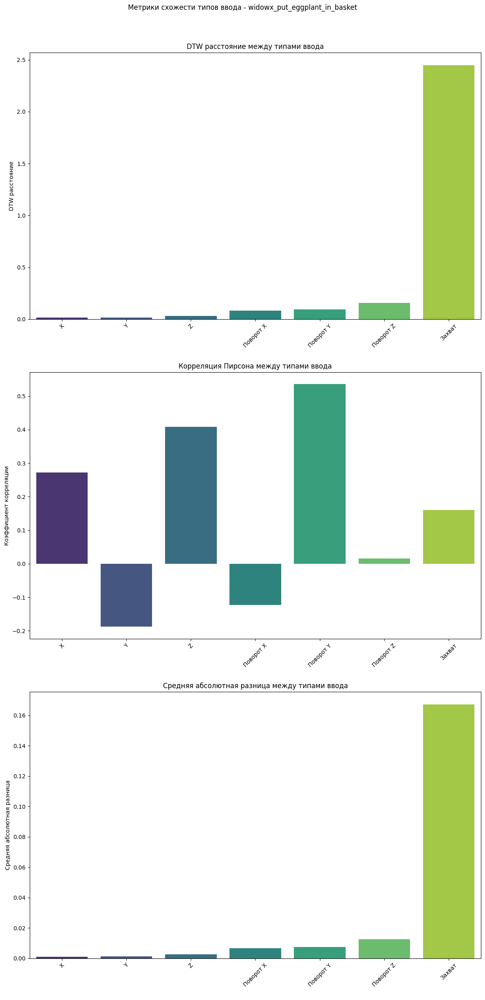

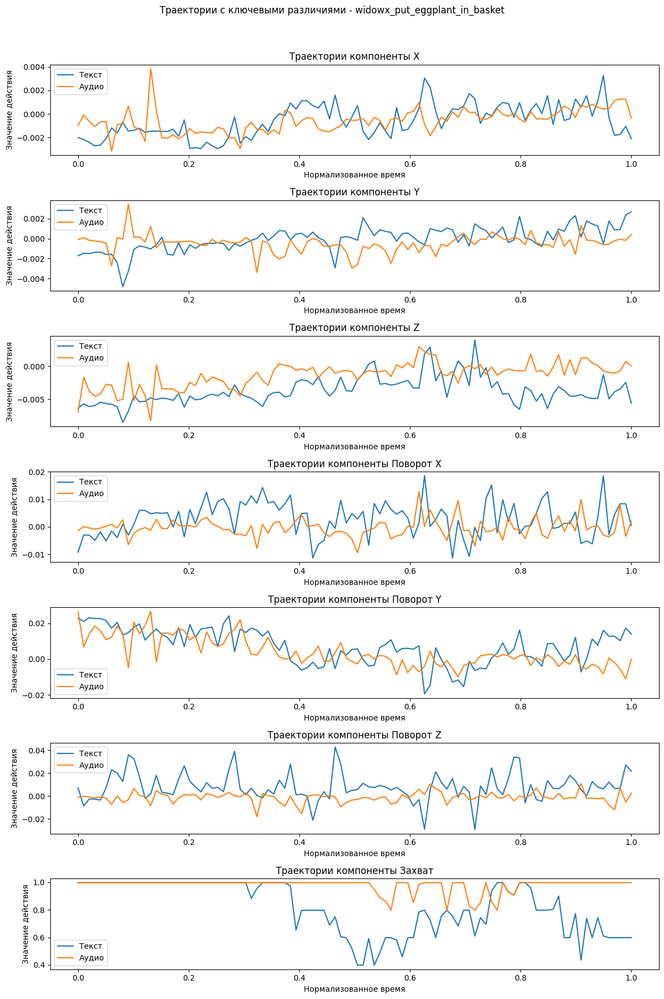


Сводка по схожести компонент:


,DTW расстояние,Корреляция Пирсона,Сред. абс. разница,Макс. разница,Кадр макс. разницы
X,0.015,0.272,0.001,0.005,13
Y,0.017,-0.188,0.001,0.007,9
Z,0.032,0.409,0.003,0.007,9
Поворот X,0.081,-0.123,0.007,0.022,94
Поворот Y,0.093,0.536,0.008,0.028,98
Поворот Z,0.159,0.016,0.012,0.044,46
Захват,2.449,0.160,0.167,0.598,50


In [ ]:
# Example usage
if __name__ == "__main__":
    analyzer = InputSimilarityAnalyzer()
    results = analyzer.analyze_task(
        task="widowx_put_eggplant_in_basket",
        max_iter=10
    )

,input_type,success_rate,avg_steps
0,text,0.0,121.0
1,audio,0.0,121.0


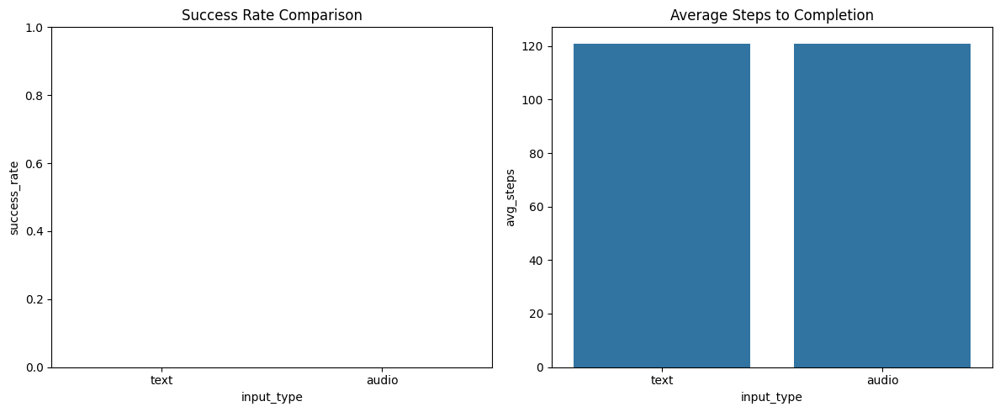

<ipython-input-5-9643b9dbe3d2>:138: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


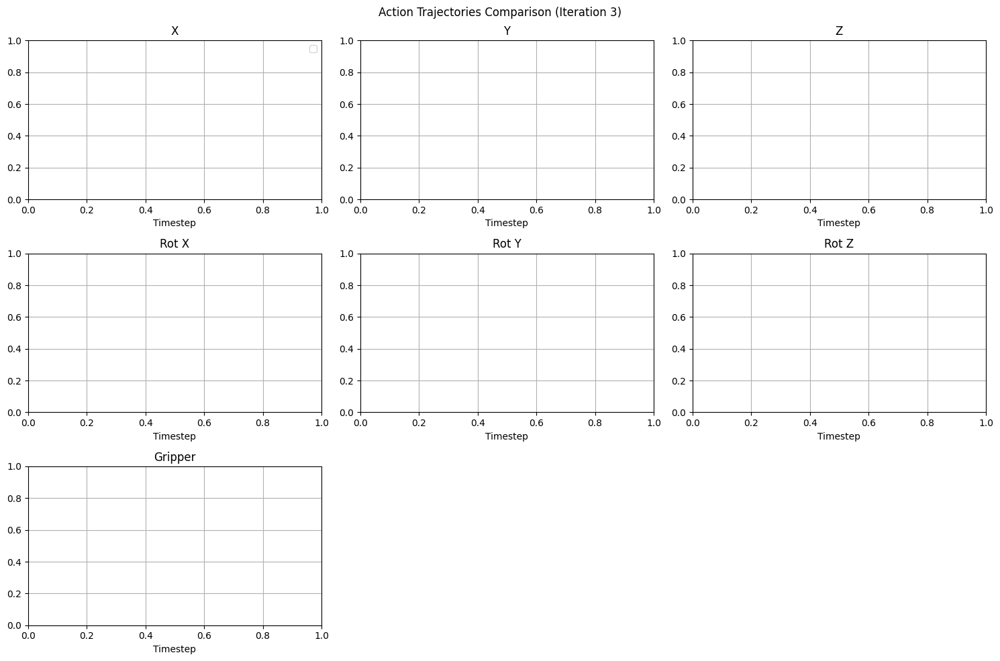

ValueError: min() arg is an empty sequence

In [ ]:
# @title Results comparator


# @markdown ### Basic Settings
task_to_compare = "widowx_put_eggplant_in_basket" # @param ["", "google_robot_pick_coke_can", "google_robot_move_near", "google_robot_open_drawer", "google_robot_close_drawer", "widowx_spoon_on_towel", "widowx_carrot_on_plate", "widowx_stack_cube", "widowx_put_eggplant_in_basket"] {allow-input: true}
input_type_text = True # @param {type:"boolean"}
input_type_audio = True # @param {type:"boolean"}

input_types_to_compare = []
if input_type_text:
    input_types_to_compare.append("text")
if input_type_audio:
    input_types_to_compare.append("audio")

start_iteration = 1 # @param {type:"slider", min:0, max:9, step:1}
end_iteration = 2 # @param {type:"slider", min:1, max:10, step:1}
iterations_to_compare = range(start_iteration, end_iteration)

# @markdown ### Comparison Modules to Run
run_aggregate_metrics = True # @param {type:"boolean"}
run_visual_comparison = True # @param {type:"boolean"}
run_statistical_tests = True # @param {type:"boolean"}
run_action_space_analysis = True # @param {type:"boolean"}
run_qualitative_comparison = True # @param {type:"boolean"}

# @markdown ### Visual Comparison Settings
compare_iteration = 3 # @param {type:"slider", min:0, max:10, step:1}
show_action_trajectories = True # @param {type:"boolean"}
show_side_by_side_video = True # @param {type:"boolean"}
video_fps = 10 # @param {type:"slider", min:1, max:30, step:1}

# @markdown ### Qualitative Comparison Settings
num_key_frames = 5 # @param {type:"slider", min:1, max:10, step:1}
show_final_states = True # @param {type:"boolean"}


import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
import pickle
from scipy import stats
import seaborn as sns
from IPython.display import display, HTML
import mediapy

class ResultComparator:
    def __init__(self, output_dir="experiment_results"):
        self.output_dir = Path(output_dir)
        self.all_results = {}

    def load_all_data(self, task_name, input_types, iterations):
        """Load all data for a task across input types and iterations"""
        self.task_name = task_name
        self.input_types = input_types
        self.iterations = iterations

        for input_type in input_types:
            self.all_results[input_type] = {}
            for iteration in iterations:
                base_name = f"{task_name}_{input_type}_{iteration}"
                try:
                    result = {
                        'actions': np.load(self.output_dir / f"data_{base_name}.npy"),
                        'success': np.load(self.output_dir / f"success_{base_name}.npy"),
                        'truncated': np.load(self.output_dir / f"truncated_{base_name}.npy"),
                        'images': np.load(self.output_dir / f"camera_{base_name}.npy"),
                    }
                    with open(self.output_dir / f"info_{base_name}.pkl", "rb") as f:
                        result['info'] = pickle.load(f)

                    result['steps'] = len(result['actions'])
                    self.all_results[input_type][iteration] = result
                except FileNotFoundError:
                    print(f"Warning: Missing data for {base_name}")
                    continue

class AggregateMetricsComparator:
    def __init__(self, all_results):
        self.all_results = all_results

    def compare(self):
        metrics = {
            'input_type': [],
            'success_rate': [],
            'avg_steps': [],
        }

        for input_type, iterations_data in self.all_results.items():
            successes = []
            steps = []

            for iteration, data in iterations_data.items():
                successes.append(data['success'])
                steps.append(data['steps'])

            metrics['input_type'].append(input_type)
            metrics['success_rate'].append(np.mean(successes))
            metrics['avg_steps'].append(np.mean(steps))

        self.metrics_df = pd.DataFrame(metrics)
        return self.metrics_df

    def visualize(self):
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))

        # Success Rate
        sns.barplot(x='input_type', y='success_rate', data=self.metrics_df, ax=axes[0])
        axes[0].set_title('Success Rate Comparison')
        axes[0].set_ylim(0, 1)

        # Steps
        sns.barplot(x='input_type', y='avg_steps', data=self.metrics_df, ax=axes[1])
        axes[1].set_title('Average Steps to Completion')

        plt.tight_layout()
        plt.show()

class VisualComparator:
    def __init__(self, all_results):
        self.all_results = all_results

    def compare_action_trajectories(self, iteration=0):
        """Compare action trajectories across input types for a specific iteration"""
        plt.figure(figsize=(15, 10))
        action_labels = ['X', 'Y', 'Z', 'Rot X', 'Rot Y', 'Rot Z', 'Gripper']

        for i, action in enumerate(action_labels):
            plt.subplot(3, 3, i+1)
            for input_type in self.all_results.keys():
                if iteration in self.all_results[input_type]:
                    data = self.all_results[input_type][iteration]['actions']
                    plt.plot(data[:, i], label=input_type)
            plt.title(action)
            plt.xlabel('Timestep')
            plt.grid(True)
            if i == 0:
                plt.legend()

        plt.suptitle(f'Action Trajectories Comparison (Iteration {iteration})')
        plt.tight_layout()
        plt.show()

    def generate_comparison_video(self, iterations=[0], fps=10):
        """Generate side-by-side videos for different input types"""
        max_frames = min([len(self.all_results[input_type][iter]['images'])
                         for input_type in self.all_results
                         for iter in iterations if iter in self.all_results[input_type]])

        for iteration in iterations:
            videos = []
            for input_type in self.all_results.keys():
                if iteration in self.all_results[input_type]:
                    vid = self.all_results[input_type][iteration]['images'][:max_frames]
                    videos.append(vid)

            if videos:
                concatenated = np.concatenate(videos, axis=2)  # Side-by-side
                mediapy.show_video(concatenated, fps=fps, title=f'Iteration {iteration} Comparison')

class StatisticalComparator:
    def __init__(self, all_results):
        self.all_results = all_results

    def perform_tests(self):
        """Perform statistical tests between input types"""
        # Prepare data
        success_data = {}

        for input_type in self.all_results.keys():
            success_data[input_type] = [data['success']
                                      for data in self.all_results[input_type].values()]

        # Compare all pairs of input types
        input_types = list(self.all_results.keys())
        results = []

        for i in range(len(input_types)):
            for j in range(i+1, len(input_types)):
                type1, type2 = input_types[i], input_types[j]

                # Chi-square test for success rates
                success1 = sum(success_data[type1])
                success2 = sum(success_data[type2])
                total1 = len(success_data[type1])
                total2 = len(success_data[type2])

                # Skip if all successes or all failures in both groups
                if (success1 in [0, total1]) and (success2 in [0, total2]):
                    results.append({
                        'comparison': f"{type1} vs {type2}",
                        'metric': 'success_rate',
                        'note': 'Cannot compute - all successes or all failures in both groups'
                    })
                else:
                    try:
                        contingency = [[success1, total1-success1],
                                    [success2, total2-success2]]
                        chi2, p_val, _, _ = stats.chi2_contingency(contingency)
                        results.append({
                            'comparison': f"{type1} vs {type2}",
                            'metric': 'success_rate',
                            'chi2_statistic': chi2,
                            'p_value': p_val,
                            'significant': p_val < 0.05
                        })
                    except ValueError:
                        results.append({
                            'comparison': f"{type1} vs {type2}",
                            'metric': 'success_rate',
                            'note': 'Cannot compute - invalid contingency table'
                        })

        self.stat_results = pd.DataFrame(results)
        return self.stat_results

    def visualize_distributions(self):
        """Visualize distributions of key metrics"""
        # Prepare data
        success_data = []

        for input_type in self.all_results.keys():
            for iteration, data in self.all_results[input_type].items():
                success_data.append({
                    'input_type': input_type,
                    'success': float(data['success'])  # Convert bool to float for plotting
                })

        success_df = pd.DataFrame(success_data)

        # Create figure
        plt.figure(figsize=(5, 5))

        # Plot success rates if we have variance
        if len(success_df) > 0 and len(success_df['success'].unique()) > 1:
            sns.barplot(x='input_type', y='success', data=success_df)
            plt.title('Success Rates')
            plt.ylim(0, 1)

        plt.tight_layout()
        plt.show()

class ActionSpaceComparator:
    def __init__(self, all_results):
        self.all_results = all_results

    def compare_action_distributions(self):
        """Compare distributions of action components"""
        action_labels = ['X', 'Y', 'Z', 'Rot X', 'Rot Y', 'Rot Z', 'Gripper']

        # Prepare data
        action_data = []
        for input_type in self.all_results.keys():
            for iteration, data in self.all_results[input_type].items():
                actions = data['actions']
                for i, label in enumerate(action_labels):
                    for value in actions[:, i]:
                        action_data.append({
                            'input_type': input_type,
                            'action_component': label,
                            'value': value
                        })

        action_df = pd.DataFrame(action_data)

        # Plot
        plt.figure(figsize=(15, 8))
        sns.boxplot(x='action_component', y='value', hue='input_type', data=action_df)
        plt.title('Action Component Distributions by Input Type')
        plt.grid(True)
        plt.show()

    def compare_action_smoothness(self):
        """Compare smoothness of action trajectories"""
        smoothness_data = []
        for input_type in self.all_results.keys():
            for iteration, data in self.all_results[input_type].items():
                actions = data['actions']
                # Calculate mean absolute difference between consecutive steps
                diffs = np.mean(np.abs(np.diff(actions, axis=0)), axis=0)
                for i, label in enumerate(['X', 'Y', 'Z', 'Rot X', 'Rot Y', 'Rot Z', 'Gripper']):
                    smoothness_data.append({
                        'input_type': input_type,
                        'action_component': label,
                        'smoothness': diffs[i]
                    })

        smoothness_df = pd.DataFrame(smoothness_data)

        plt.figure(figsize=(15, 6))
        sns.boxplot(x='action_component', y='smoothness', hue='input_type', data=smoothness_df)
        plt.title('Action Smoothness (Lower is Smoother)')
        plt.grid(True)
        plt.show()

class QualitativeComparator:
    def __init__(self, all_results):
        self.all_results = all_results

    def create_comparison_montage(self, iteration=0, num_frames=5):
        """Create side-by-side comparison of key frames"""
        fig, axes = plt.subplots(num_frames, len(self.all_results),
                               figsize=(15, 3*num_frames))

        if num_frames == 1:
            axes = axes.reshape(1, -1)

        for col, input_type in enumerate(self.all_results.keys()):
            if iteration in self.all_results[input_type]:
                images = self.all_results[input_type][iteration]['images']
                step = len(images) // num_frames

                for row in range(num_frames):
                    frame_idx = min(row * step, len(images)-1)
                    ax = axes[row, col]
                    ax.imshow(images[frame_idx])
                    if row == 0:
                        ax.set_title(input_type)
                    ax.set_xticks([])
                    ax.set_yticks([])
                    ax.set_xlabel(f"Frame {frame_idx}")

        plt.suptitle(f'Key Frame Comparison (Iteration {iteration})', y=1.02)
        plt.tight_layout()
        plt.show()

    def compare_final_states(self, iteration=0):
        """Compare final states achieved by different input types"""
        fig, axes = plt.subplots(1, len(self.all_results), figsize=(15, 5))

        if len(self.all_results) == 1:
            axes = [axes]

        for col, input_type in enumerate(self.all_results.keys()):
            if iteration in self.all_results[input_type]:
                images = self.all_results[input_type][iteration]['images']
                ax = axes[col]
                ax.imshow(images[-1])
                ax.set_title(f"{input_type} (Success: {self.all_results[input_type][iteration]['success']})")
                ax.set_xticks([])
                ax.set_yticks([])

        plt.suptitle('Final State Comparison', y=1.02)
        plt.tight_layout()
        plt.show()

# Main execution
if __name__ == "__main__":
    display(HTML(f"<h1>Comparison Visualizer: {task_to_compare}</h1>"))

    # Initialize and load data
    comparator = ResultComparator()
    comparator.load_all_data(task_to_compare, input_types_to_compare, iterations_to_compare)

    # Run selected comparisons
    if run_aggregate_metrics:
        display(HTML("<h2>Aggregate Metrics Comparison</h2>"))
        agg_comp = AggregateMetricsComparator(comparator.all_results)
        agg_metrics = agg_comp.compare()
        display(agg_metrics)
        agg_comp.visualize()

    if run_visual_comparison:
        display(HTML("<h2>Visual Comparison</h2>"))
        vis_comp = VisualComparator(comparator.all_results)
        if show_action_trajectories:
            vis_comp.compare_action_trajectories(iteration=compare_iteration)
        if show_side_by_side_video:
            vis_comp.generate_comparison_video(iterations=[compare_iteration], fps=video_fps)

    if run_statistical_tests:
        display(HTML("<h2>Statistical Comparison</h2>"))
        stat_comp = StatisticalComparator(comparator.all_results)
        stat_results = stat_comp.perform_tests()
        display(stat_results)
        stat_comp.visualize_distributions()

    if run_action_space_analysis:
        display(HTML("<h2>Action Space Analysis</h2>"))
        action_comp = ActionSpaceComparator(comparator.all_results)
        action_comp.compare_action_distributions()
        action_comp.compare_action_smoothness()

    if run_qualitative_comparison:
        display(HTML("<h2>Qualitative Comparison</h2>"))
        qual_comp = QualitativeComparator(comparator.all_results)
        qual_comp.create_comparison_montage(iteration=compare_iteration, num_frames=num_key_frames)
        if show_final_states:
            qual_comp.compare_final_states(iteration=compare_iteration)

    display(HTML("<h3>Comparison Complete!</h3>"))

# Evaluation (manual)

In [ ]:
import os
import numpy as np
import simpler_env
from simpler_env.utils.env.observation_utils import get_image_from_maniskill2_obs_dict
import mediapy
import sapien

In [ ]:
task_name = "widowx_put_eggplant_in_basket"  # @param ["google_robot_pick_coke_can", "google_robot_move_near", "google_robot_open_drawer", "google_robot_close_drawer", "widowx_spoon_on_towel", "widowx_carrot_on_plate", "widowx_stack_cube", "widowx_put_eggplant_in_basket"]

if 'env' in locals():
  print("Closing existing env")
  env.close()
  del env
env = simpler_env.make(task_name)

obs, reset_info = env.reset()
instruction = env.get_language_instruction()
print("Reset info:", reset_info)
print("Instruction:", instruction)

if "google" in task_name:
  policy_setup = "google_robot"
else:
  policy_setup = "widowx_bridge"

Reset info: {'scene_name': 'bridge_table_1_v2', 'scene_offset': None, 'scene_pose': None, 'scene_table_height': 0.87, 'urdf_version': '', 'rgb_overlay_path': '/content/ManiSkill2_real2sim/data/real_inpainting/bridge_sink.png', 'rgb_overlay_cameras': ['3rd_view_camera'], 'rgb_overlay_mode': 'background', 'disable_bad_material': False, 'episode_model_ids': ['eggplant', 'dummy_sink_target_plane'], 'episode_model_scales': [1.0, 1.0], 'episode_source_obj_name': 'eggplant', 'episode_target_obj_name': 'dummy_sink_target_plane', 'episode_source_obj_init_pose_wrt_robot_base': Pose([0.246488, -0.130078, 0.0887247], [0.399633, -0.116981, 0.0274486, -0.908766]), 'episode_target_obj_init_pose_wrt_robot_base': Pose([0.275236, 0.0375851, 0.0858802], [0.0120072, 0.0649478, -0.00353153, -0.99781]), 'episode_id': 1}
Instruction: put eggplant into yellow basket


/usr/local/lib/python3.11/dist-packages/gymnasium/core.py:311: UserWarning: WARN: env.get_language_instruction to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.get_language_instruction` for environment variables or `env.get_wrapper_attr('get_language_instruction')` that will search the reminding wrappers.
  logger.warn(


In [ ]:
obs, reset_info = env.reset()
instruction = env.get_language_instruction()
model = VoiceOpenVLAInference()

input_type = "audio" # @param ["audio", "text"]

if "text" in input_type:
    model.reset(instruction)
else:
    embedding_path = "/content/drive/MyDrive/thesis/"f"{task_name}_embeddings.pt"
    projected_embeds = torch.load(embedding_path)
    model.reset(projected_embeds)

print(f"Instruction: {instruction}")

image = get_image_from_maniskill2_obs_dict(env, obs)
images = [image]
predicted_raw_actions = []
predicted_terminated, success, truncated = False, False, False
timestep = 0

while not (predicted_terminated or truncated):
    raw_action, action = model.step(image)
    predicted_raw_actions.append(raw_action)

    predicted_terminated = bool(action["terminate_episode"][0] > 0)
    full_action = np.concatenate([
        action["world_vector"],
        action["rot_axangle"],
        action["gripper"]
    ])

    obs, reward, success, truncated, info = env.step(full_action)

    print(f"Timestep {timestep}:")
    print(f"Action: {full_action}")
    print(f"Info: {info}")

    image = get_image_from_maniskill2_obs_dict(env, obs)
    images.append(image)
    timestep += 1

    if timestep % 5 == 0:
        mediapy.show_image(image)
        model.visualize_epoch(predicted_raw_actions, images, save_path=None)
        plt.show()

print("\nGenerating action visualization...")
plt.figure(figsize=(15, 10))
model.visualize_epoch(
    predicted_raw_actions=predicted_raw_actions,
    images=images,
    save_path=None  # Passing None will show plot instead of saving
)
plt.tight_layout()
plt.show()

episode_stats = info.get("episode_stats", {})
print(f"Episode success: {success}")
print(f"Total timesteps: {timestep}")

Output hidden; open in https://colab.research.google.com to view.

# Results (manual)

old func
widowx_put_eggplant_in_basket
audio


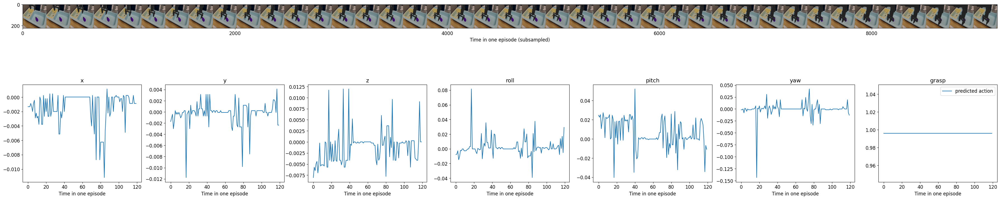

In [ ]:
print("old func")
print(task_name)
print(input_type)
model.visualize_epoch(predicted_raw_actions, images, save_path=None)
plt.show()
mediapy.show_video(images, fps=10)

new func
widowx_put_eggplant_in_basket
audio


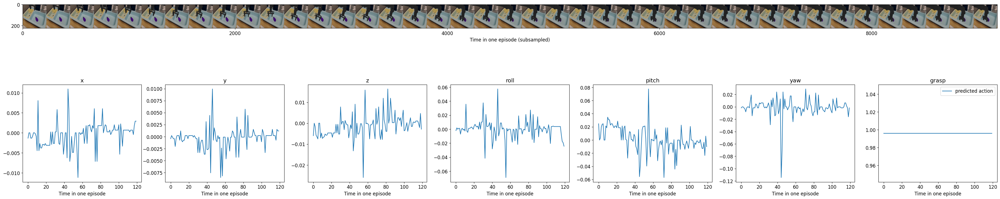

In [ ]:
print("new func")
print(task_name)
print(input_type)
model.visualize_epoch(predicted_raw_actions, images, save_path=None)
plt.show()
mediapy.show_video(images, fps=10)

old func
widowx_put_eggplant_in_basket
text


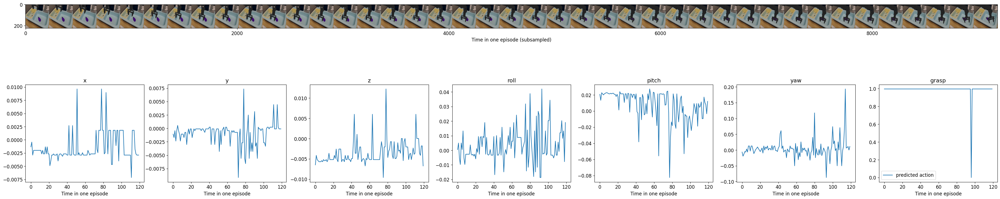

In [ ]:
print("old func")
print(task_name)
print(input_type)
model.visualize_epoch(predicted_raw_actions, images, save_path=None)
plt.show()
mediapy.show_video(images, fps=10)

new func
widowx_put_eggplant_in_basket
text


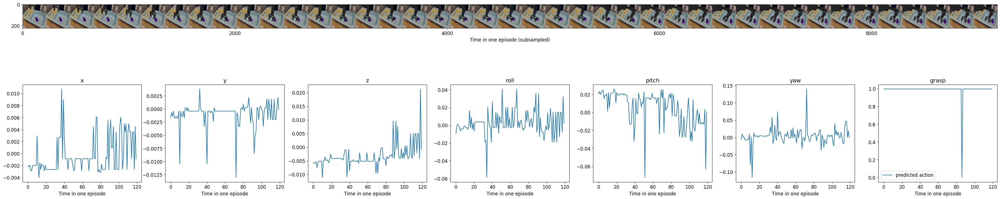

In [ ]:
print("new func")
print(task_name)
print(input_type)
model.visualize_epoch(predicted_raw_actions, images, save_path=None)
plt.show()
mediapy.show_video(images, fps=10)

google_robot_move_near
text


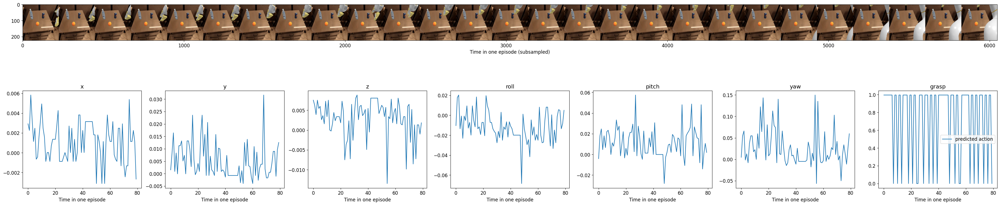

In [ ]:
print(task_name)
print(input_type)
model.visualize_epoch(predicted_raw_actions, images, save_path=None)
plt.show()
mediapy.show_video(images, fps=10)

google_robot_move_near
audio


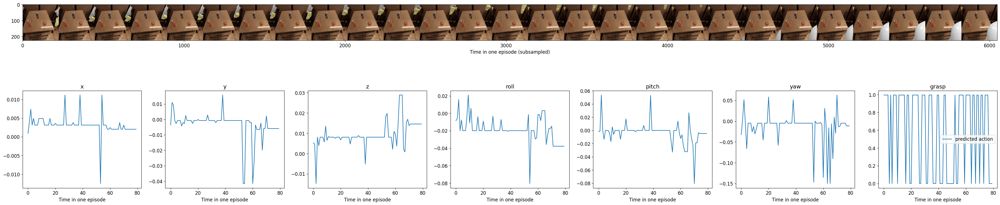

In [ ]:
print(task_name)
print(input_type)
model.visualize_epoch(predicted_raw_actions, images, save_path=None)
plt.show()
mediapy.show_video(images, fps=10)

widowx_spoon_on_towel
audio


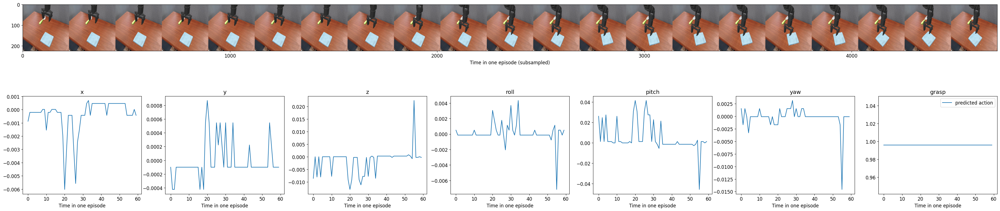

In [ ]:
print(task_name)
print(input_type)
model.visualize_epoch(predicted_raw_actions, images, save_path=None)
plt.show()
mediapy.show_video(images, fps=10)

widowx_spoon_on_towel
text


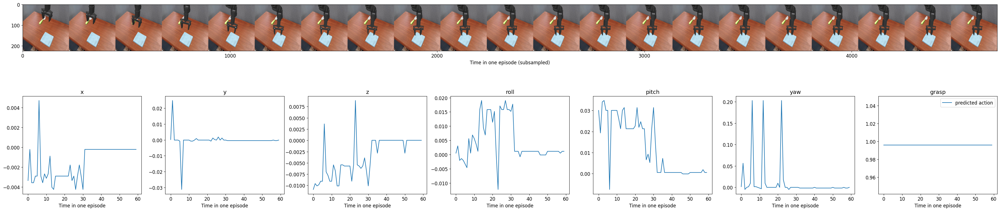

In [ ]:
print(task_name)
print(input_type)
model.visualize_epoch(predicted_raw_actions, images, save_path=None)
plt.show()
mediapy.show_video(images, fps=10)

# Misc

In [ ]:
!zip -r analysis_results.zip /content/analysis_results

  adding: content/analysis_results/ (stored 0%)
  adding: content/analysis_results/action_patterns.png (deflated 24%)
  adding: content/analysis_results/success_metrics.png (deflated 22%)
  adding: content/analysis_results/temporal_dynamics.png (deflated 4%)
  adding: content/analysis_results/input_type_success_summary.csv (deflated 40%)
  adding: content/analysis_results/task_success_summary.csv (deflated 48%)
  adding: content/analysis_results/statistical_test_results.csv (deflated 80%)
  adding: content/analysis_results/action_component_evolution.png (deflated 2%)
  adding: content/analysis_results/component_importance.csv (deflated 39%)
  adding: content/analysis_results/.ipynb_checkpoints/ (stored 0%)
  adding: content/analysis_results/info_metric_comparison.png (deflated 14%)


In [ ]:
from google.colab import files
files.download('analysis_results.zip')
files.download('experiment_results.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import os
from typing import Optional, Union, Tuple, Dict, Sequence
import torch
import numpy as np
import cv2 as cv
from PIL import Image
import matplotlib.pyplot as plt
from transformers import AutoProcessor, AutoModelForVision2Seq, BitsAndBytesConfig
from scipy.spatial.transform import Rotation

# Class-level variables for model reuse
_shared_model = None
_shared_processor = None
_shared_model_config = None

def euler2axangle(roll: float, pitch: float, yaw: float) -> Tuple[np.ndarray, float]:
    r = Rotation.from_euler('xyz', [roll, pitch, yaw])
    axis_angle = r.as_rotvec()
    angle = np.linalg.norm(axis_angle)
    return (axis_angle / angle, angle) if angle > 1e-10 else (np.array([1., 0., 0.]), 0.0)

class VoiceOpenVLAInference:
    def __init__(
        self,
        saved_model_path: str = "openvla/openvla-7b",
        unnorm_key: Optional[str] = None,
        policy_setup: str = "widowx_bridge",
        horizon: int = 1,
        pred_action_horizon: int = 1,
        exec_horizon: int = 1,
        image_size: list[int] = [224, 224],
        action_scale: float = 1.0,
        load_4bit: bool = False,
        load_8bit: bool = True,
    ) -> None:
        os.environ["TOKENIZERS_PARALLELISM"] = "false"

        if policy_setup == "widowx_bridge":
            unnorm_key = "bridge_orig" if unnorm_key is None else unnorm_key
            self.sticky_gripper_num_repeat = 1
        elif policy_setup == "google_robot":
            unnorm_key = "fractal20220817_data" if unnorm_key is None else unnorm_key
            self.sticky_gripper_num_repeat = 15
        else:
            raise NotImplementedError(f"Policy setup {policy_setup} not supported.")

        self.policy_setup = policy_setup
        self.unnorm_key = unnorm_key
        self.image_size = image_size
        self.action_scale = action_scale
        self.horizon = horizon
        self.pred_action_horizon = pred_action_horizon
        self.exec_horizon = exec_horizon
        self.device = "cuda" if torch.cuda.is_available() else "cpu"
        self.base_prompt = "In: What action should the robot take to do this?\nOut:"
        self.original_forward = None

        global _shared_model, _shared_processor, _shared_model_config

        # Skip loading if shared model exists with same config
        current_config = (saved_model_path, load_4bit, load_8bit)
        if _shared_model is None or _shared_model_config != current_config:
            quantization_config = None
            if load_4bit:
                quantization_config = BitsAndBytesConfig(
                    load_in_4bit=True,
                    bnb_4bit_compute_dtype=torch.float16,
                    bnb_4bit_quant_type="nf4",
                    bnb_4bit_use_double_quant=True,
                )
            elif load_8bit:
                quantization_config = BitsAndBytesConfig(load_in_8bit=True)

            self.vla = AutoModelForVision2Seq.from_pretrained(
                saved_model_path,
                quantization_config=quantization_config,
                device_map="auto",
                torch_dtype=torch.float16 if not (load_4bit or load_8bit) else None,
                trust_remote_code=True,
            )
            self.processor = AutoProcessor.from_pretrained(saved_model_path, trust_remote_code=True)

            # Update shared references
            _shared_model = self.vla
            _shared_processor = self.processor
            _shared_model_config = current_config
        else:
            # Reuse shared model
            self.vla = _shared_model
            self.processor = _shared_processor

        self.reset()

    def reset(self, instruction: Optional[Union[str, torch.Tensor]] = None) -> None:
        """Reset with new instruction (text or audio embeddings)."""
        self.sticky_action_is_on = False
        self.gripper_action_repeat = 0
        self.sticky_gripper_action = 0.0
        self.previous_gripper_action = None

        if isinstance(instruction, str):
            self.task_description = instruction
            self.audio_embeddings = None
        elif isinstance(instruction, torch.Tensor):
            self.audio_embeddings = instruction.to(dtype=torch.float16, device=self.device)
            self.task_description = None
        elif instruction is None:
            self.task_description = None
            self.audio_embeddings = None
        else:
            raise ValueError("Instruction must be str or Tensor.")

    def _custom_forward(self, input_ids=None, attention_mask=None, pixel_values=None, **kwargs):
        audio_embeddings = kwargs.pop('audio_embeddings', None)
        outputs = self.original_forward(
            input_ids=input_ids,
            attention_mask=attention_mask,
            pixel_values=pixel_values,
            **kwargs
        )

        if audio_embeddings is not None:
            audio_weights = torch.softmax(torch.mean(audio_embeddings, dim=-1), dim=-1)
            audio_features = torch.sum(audio_embeddings * audio_weights.unsqueeze(-1), dim=1)
            output_embeddings = self.vla.get_output_embeddings().weight.to(torch.float16)
            outputs.logits = outputs.logits.to(torch.float16) + 0.5 * (audio_features @ output_embeddings.T)

        return outputs

    def _prepare_audio_inputs(self, image: Image.Image) -> Dict:
        assert self.audio_embeddings is not None, "No audio embeddings set"

        audio_embeddings = self.audio_embeddings.unsqueeze(0) if len(self.audio_embeddings.shape) == 2 else self.audio_embeddings
        audio_length = audio_embeddings.shape[1]

        inputs = self.processor(
            text=self.base_prompt,
            images=image,
            return_tensors="pt",
        ).to(self.device, dtype=torch.float16)

        attention_mask = torch.ones(
            (1, audio_length + inputs["input_ids"].shape[1]),
            dtype=torch.float16,
            device=self.device
        )
        attention_mask[:, :audio_length] = 0.7
        attention_mask[:, audio_length-4:audio_length] = 3.0

        return {
            "input_ids": inputs["input_ids"],
            "attention_mask": attention_mask,
            "pixel_values": inputs["pixel_values"],
            "audio_embeddings": audio_embeddings,
        }

    def step(self, image: np.ndarray) -> Tuple[Dict[str, np.ndarray], Dict[str, np.ndarray]]:
        assert image.dtype == np.uint8
        image = self._resize_image(image)
        image_pil = Image.fromarray(image)

        if self.audio_embeddings is not None:
            inputs = self._prepare_audio_inputs(image_pil)
            self.original_forward = self.vla.forward
            self.vla.forward = self._custom_forward

            try:
                with torch.inference_mode():
                    predict_kwargs = {
                        k: v for k, v in inputs.items()
                        if k != 'audio_embeddings'
                    }
                    raw_actions = self.vla.predict_action(
                        **predict_kwargs,
                        unnorm_key=self.unnorm_key,
                        do_sample=False
                    )[None]
            finally:
                self.vla.forward = self.original_forward

        elif self.task_description is not None:
            inputs = self.processor(
                text=self.task_description,
                images=image_pil,
                return_tensors="pt"
            ).to(self.device, dtype=torch.float16)
            raw_actions = self.vla.predict_action(**inputs, unnorm_key=self.unnorm_key, do_sample=False)[None]
        else:
            raise RuntimeError("No instruction provided. Call reset() first.")

        raw_action = {
            "world_vector": np.array(raw_actions[0, :3]),
            "rotation_delta": np.array(raw_actions[0, 3:6]),
            "open_gripper": np.array(raw_actions[0, 6:7]),
        }

        action = {}
        action["world_vector"] = raw_action["world_vector"] * self.action_scale
        axis, angle = euler2axangle(*raw_action["rotation_delta"])
        action["rot_axangle"] = axis * angle * self.action_scale

        if self.policy_setup == "google_robot":
            current_gripper_action = raw_action["open_gripper"]
            if self.previous_gripper_action is None:
                relative_gripper_action = np.array([0])
            else:
                relative_gripper_action = self.previous_gripper_action - current_gripper_action
            self.previous_gripper_action = current_gripper_action

            if np.abs(relative_gripper_action) > 0.5 and (not self.sticky_action_is_on):
                self.sticky_action_is_on = True
                self.sticky_gripper_action = relative_gripper_action

            if self.sticky_action_is_on:
                self.gripper_action_repeat += 1
                relative_gripper_action = self.sticky_gripper_action

            if self.gripper_action_repeat == self.sticky_gripper_num_repeat:
                self.sticky_action_is_on = False
                self.gripper_action_repeat = 0
                self.sticky_gripper_action = 0.0

            action["gripper"] = relative_gripper_action
        elif self.policy_setup == "widowx_bridge":
            action["gripper"] = 2.0 * (raw_action["open_gripper"] > 0.5) - 1.0

        action["terminate_episode"] = np.array([0.0])
        return raw_action, action

    def _resize_image(self, image: np.ndarray) -> np.ndarray:
        return cv.resize(image, tuple(self.image_size), interpolation=cv.INTER_AREA)

    def visualize_epoch(self, predicted_raw_actions: Sequence[np.ndarray], images: Sequence[np.ndarray], save_path: Optional[str] = None) -> None:
        images = [self._resize_image(image) for image in images]
        ACTION_DIM_LABELS = ["x", "y", "z", "roll", "pitch", "yaw", "grasp"]

        img_strip = np.concatenate(np.array(images[::3]), axis=1)

        figure_layout = [["image"] * len(ACTION_DIM_LABELS), ACTION_DIM_LABELS]
        plt.rcParams.update({"font.size": 12})
        fig, axs = plt.subplot_mosaic(figure_layout)
        fig.set_size_inches([45, 10])

        pred_actions = np.array([
            np.concatenate([a["world_vector"], a["rotation_delta"], a["open_gripper"]], axis=-1)
            for a in predicted_raw_actions
        ])

        for action_dim, action_label in enumerate(ACTION_DIM_LABELS):
            axs[action_label].plot(pred_actions[:, action_dim], label="predicted action")
            axs[action_label].set_title(action_label)
            axs[action_label].set_xlabel("Time in one episode")

        axs["image"].imshow(img_strip)
        axs["image"].set_xlabel("Time in one episode (subsampled)")
        plt.legend()

        if save_path is not None:
            plt.savefig(save_path)
        plt.show()  # Always show the plot
        plt.close()  # Close the figure to free memory